In [ ]:
import random
import pickle
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from prettytable import PrettyTable
import sklearn
from sklearn import metrics
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.model_selection import TimeSeriesSplit, train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import roc_auc_score
from sklearn.calibration import CalibratedClassifierCV
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Loading Train Dataset

train_transaction = pd.read_csv('/content/drive/MyDrive/Sanju Sarkar/train_transaction.csv')
train_identity = pd.read_csv('/content/drive/MyDrive/Sanju Sarkar/train_identity.csv')

# Loading Test Dataset

test_transaction = pd.read_csv('/content/drive/MyDrive/Sanju Sarkar/test_transaction.csv')
test_identity = pd.read_csv('/content/drive/MyDrive/Sanju Sarkar/test_identity.csv')

In [ ]:
print("Train Transaction Dataset Shape : ",train_transaction.shape)
print("Train Identity Dataset Shape : ",train_identity.shape)
print('-'*50)
print("Test Transaction Dataset Shape : ",test_transaction.shape)
print("Test Identity Dataset Shape : ",test_identity.shape)

Train Transaction Dataset Shape :  (590540, 394)
Train Identity Dataset Shape :  (144233, 41)
--------------------------------------------------
Test Transaction Dataset Shape :  (506691, 393)
Test Identity Dataset Shape :  (141907, 41)


In [ ]:
train_data = train_transaction.merge(train_identity, how='left', on='TransactionID')
del train_transaction, train_identity

test_data = test_transaction.merge(test_identity, how='left', on='TransactionID')
del test_transaction, test_identity

In [ ]:
train_data.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,F,T,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0

In [ ]:
test_data.head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id-31,id-32,id-33,id-34,id-35,id-36,id-37,id-38,DeviceType,DeviceInfo
0,3663549,18403224,31.95,W,10409,111.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3663550,18403263,49.00,W,4272,111.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3663551,18403310,171.00,W,4476,574.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3663552,18403310,284.95,W,10989,360.0,150.0,visa,166.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3663553,18403317,67.95,W,18018,452.0,150.0,mastercard,117.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
test_data.columns = test_data.columns.str.replace('^id-', 'id_', regex=True)

In [ ]:
duplicate_rows = train_data[train_data.duplicated()]
print("Duplicate Rows :", duplicate_rows)

Duplicate Rows : Empty DataFrame
Columns: [TransactionID, isFraud, TransactionDT, TransactionAmt, ProductCD, card1, card2, card3, card4, card5, card6, addr1, addr2, dist1, dist2, P_emaildomain, R_emaildomain, C1, C2, C3, C4, C5, C6, C7, C8, C9, C10, C11, C12, C13, C14, D1, D2, D3, D4, D5, D6, D7, D8, D9, D10, D11, D12, D13, D14, D15, M1, M2, M3, M4, M5, M6, M7, M8, M9, V1, V2, V3, V4, V5, V6, V7, V8, V9, V10, V11, V12, V13, V14, V15, V16, V17, V18, V19, V20, V21, V22, V23, V24, V25, V26, V27, V28, V29, V30, V31, V32, V33, V34, V35, V36, V37, V38, V39, V40, V41, V42, V43, V44, V45, ...]
Index: []


In [ ]:
def getDuplicateColumns(df):

    '''
    Utility Function to get a list of duplicate columns.
    '''

    duplicateColumnNames = set()
    # Iterate over all the columns in dataframe
    for x in range(df.shape[1]):
        # Select column at xth index.
        col = df.iloc[:, x]
        # Iterate over all the columns in DataFrame from (x+1)th index till end
        for y in range(x + 1, df.shape[1]):
            # Select column at yth index.
            otherCol = df.iloc[:, y]
            # Check if two columns at x 7 y index are equal
            if col.equals(otherCol):
                duplicateColumnNames.add(df.columns.values[y])
    return list(duplicateColumnNames)

duplicate_columns = getDuplicateColumns(train_data)

print(duplicate_columns)

[]


In [ ]:
train_data.sort_values(by='TransactionDT' ,inplace=True)
test_data.sort_values(by='TransactionDT' , inplace=True)

In [ ]:
train_data.to_pickle('/content/drive/MyDrive/Sanju Sarkar/merged_train.pkl')
test_data.to_pickle('/content/drive/MyDrive/Sanju Sarkar/merged_test.pkl')

del train_data, test_data

In [ ]:
train_data = pd.read_pickle("/content/drive/MyDrive/Sanju Sarkar/merged_train.pkl")
test_data = pd.read_pickle("/content/drive/MyDrive/Sanju Sarkar/merged_test.pkl")

In [ ]:
print("*"*35)
print("\n Train Data Shape : {} \n".format(train_data.shape))
print("\n Test Data Shape : {} \n".format(test_data.shape))
print("*"*35)

***********************************

 Train Data Shape : (590540, 434) 


 Test Data Shape : (506691, 433) 

***********************************


In [ ]:
def missing_info(column, df):

    '''
        Utility Function to compute the missing value info
        of any feature in a dataset.
    '''

    na = df[column].isna()
    count = na.sum()
    total_count = df.shape[0]
    miss_prcnt = np.round((count/total_count)*100,3)

    return (count, miss_prcnt)

In [ ]:
def missing_train_info(df):
    '''
        Utility Function to get information about missing values in the dataframe,
        for each column the following information is given by this function.

            - Number of missing values present in the column.
            - Percentage of missing values in the column.
    '''

    columns_missing_info = []

    for column in df:

        count, miss_prcnt = missing_info(column, df);

        if(count):
            columns_missing_info.append([column, count, miss_prcnt])

    column_names = ['Feature_Name', 'Missing_Count', 'Missing_Percentage']

    missing_info_df = pd.DataFrame(data = columns_missing_info, columns = column_names)

    return missing_info_df

In [ ]:
missing_train_df = missing_train_info(train_data)

In [ ]:
# Modifying the display setting of the pandas so as to view all the rows in a dataframe

pd.set_option("display.max_rows", None, "display.max_columns", None)
# pd.reset_option("display.max_rows", "display.max_columns")

In [ ]:
missing_train_df.head(train_data.shape[1])

In [ ]:
def cat_num_features(df):

    '''
        Utility Function to get the names of Categorical Features and
        Numerical Features of the given Dataset.
    '''

    catf = []
    numf = []

    # Given Categorical Features
    catf = ['ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', \
            'card6', 'addr1', 'addr2', 'P_emaildomain', 'R_emaildomain', 'M1', 'M2', \
            'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', \
            'DeviceType', 'DeviceInfo']
    catf+=['id_'+str(i) for i in range(12,39)]


    # Updating the Categorical Feature Names List based on the columns present in the dataframe
    catf = [feature for feature in catf if feature in df.columns.values]
    numf = [feature for feature in df.columns if feature not in catf and not feature == 'isFraud']

    return (catf, numf)

In [ ]:
# Storing Categorical and Numerical Feature Names

catf, numf = cat_num_features(train_data)

In [ ]:
# Filling all the NaN values of Non-Numeric Categorical Features with "NaN" string to perform EDA

non_num = [f for f in catf if train_data[f].dtype == object]
train_data[non_num] = train_data[non_num].fillna('NaN')

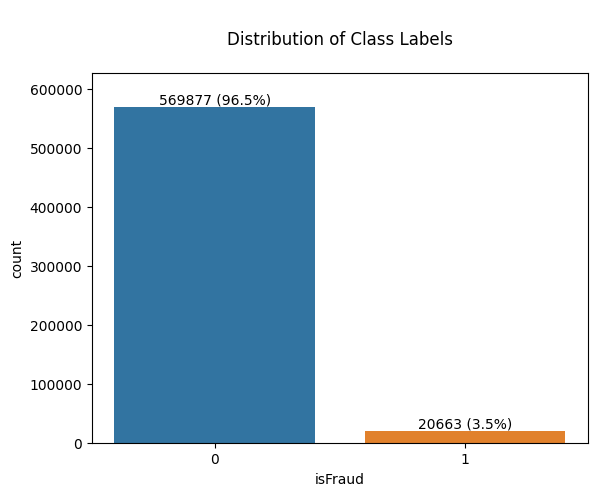

In [ ]:
ax = sns.countplot(x='isFraud', data = train_data)

plt.title("\nDistribution of Class Labels\n")

plt.margins(0.05, 0.1)

for p in ax.patches:
  x=p.get_bbox().get_points()[:,0]
  y=p.get_bbox().get_points()[1,1]
  ax.annotate('{} ({:.1f}%)'.format(int(y),100.*y/len(train_data)), (x.mean(), y),
          ha='center', va='bottom')

plt.show()

In [ ]:
# We have the followig Categorical Features

print(catf)

['ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'P_emaildomain', 'R_emaildomain', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'DeviceType', 'DeviceInfo', 'id_12', 'id_13', 'id_14', 'id_15', 'id_16', 'id_17', 'id_18', 'id_19', 'id_20', 'id_21', 'id_22', 'id_23', 'id_24', 'id_25', 'id_26', 'id_27', 'id_28', 'id_29', 'id_30', 'id_31', 'id_32', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38']


In [ ]:
train_data[['ProductCD']].describe()

,ProductCD
count,590540
unique,5
top,W
freq,439670


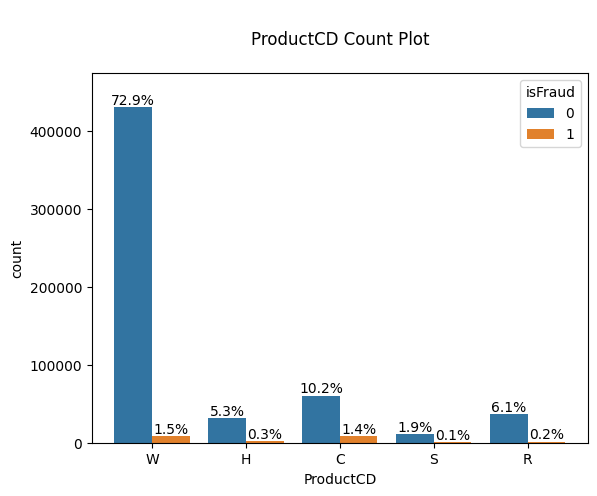

In [ ]:
ax = sns.countplot(x='ProductCD', hue='isFraud', data = train_data)

plt.margins(0.05, 0.1)

for p in ax.patches:
  x=p.get_bbox().get_points()[:,0]
  y=p.get_bbox().get_points()[1,1]
  ax.annotate('{:.1f}%'.format(100.*y/len(train_data)), (x.mean(), y),
          ha='center', va='bottom')

plt.title('\nProductCD Count Plot\n')
plt.show()

In [ ]:
card_features = ['card'+str(i) for i in range(1,7) if "card"+str(i) in catf]

In [ ]:
for f in card_features:
    print('\n',"*"*10,f,"*"*10,'\n')
    print(train_data[f].describe())
    if(train_data[f].dtype != object):
        len_unique_cat = len(np.unique(train_data[f]))
        print("\n{} feature has {} unique categories\n".format(f, len_unique_cat))


 ********** card1 ********** 

count    590540.000000
mean       9898.734658
std        4901.170153
min        1000.000000
25%        6019.000000
50%        9678.000000
75%       14184.000000
max       18396.000000
Name: card1, dtype: float64

card1 feature has 13553 unique categories


 ********** card2 ********** 

count    581607.000000
mean        362.555488
std         157.793246
min         100.000000
25%         214.000000
50%         361.000000
75%         512.000000
max         600.000000
Name: card2, dtype: float64

card2 feature has 501 unique categories


 ********** card3 ********** 

count    588975.000000
mean        153.194925
std          11.336444
min         100.000000
25%         150.000000
50%         150.000000
75%         150.000000
max         231.000000
Name: card3, dtype: float64

card3 feature has 115 unique categories


 ********** card4 ********** 

count     590540
unique         5
top         visa
freq      384767
Name: card4, dtype: object

 ********** 

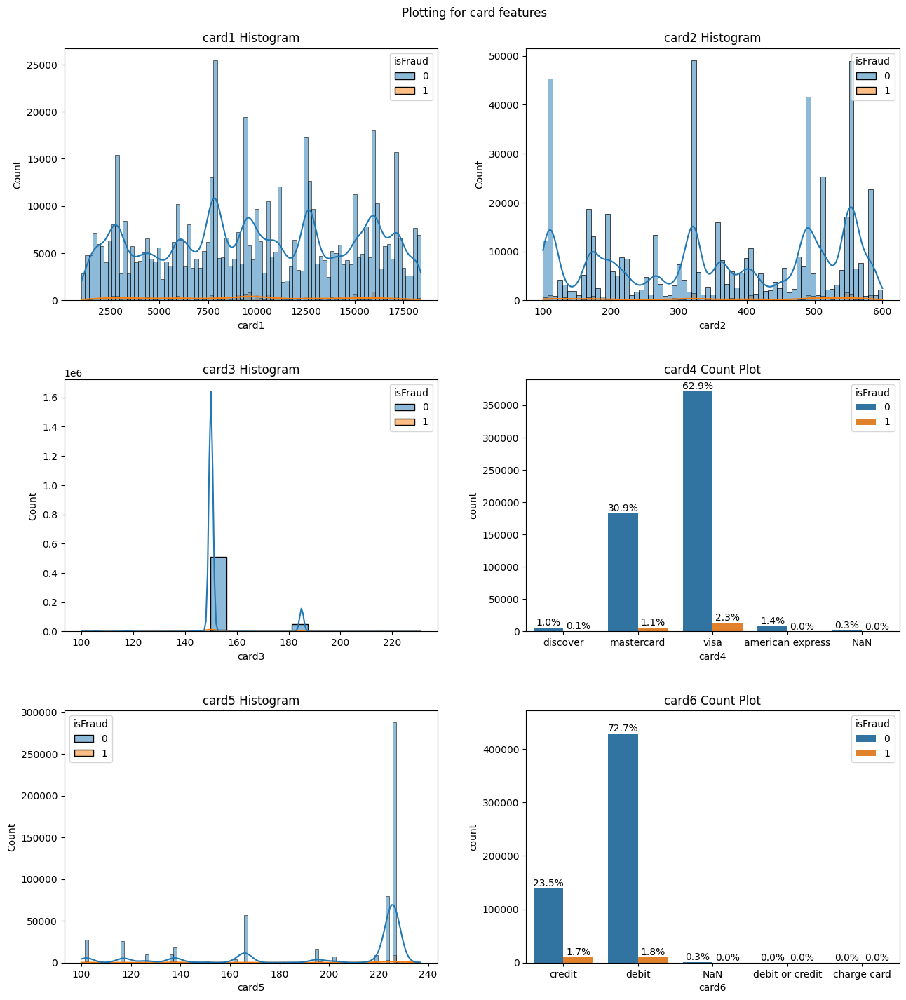

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(14, 15))

fig.tight_layout(pad=6.0)
fig.suptitle('Plotting for card features')
idx = 0

plt.margins(0.05, 0.1)

for i in range(3):
    for j in range(2):

        if(idx==len(card_features)):
            break

        f = card_features[idx]
        idx+=1

        if(train_data[f].dtype == object):
            sns.countplot(x=f,hue='isFraud', data=train_data, ax=axes[i,j])
            axes[i,j].set_title(f+" Count Plot")

            for p in axes[i,j].patches:
              x=p.get_bbox().get_points()[:,0]
              y=p.get_bbox().get_points()[1,1]
              axes[i,j].annotate('{:.1f}%'.format(100.*y/len(train_data)), (x.mean(), y),
                      ha='center', va='bottom')


        else:
            sns.histplot(x=f,hue='isFraud', data=train_data, ax=axes[i,j], kde=True)
            axes[i,j].set_title(f+" Histogram")

In [ ]:
addr_features = ['addr'+str(i) for i in range(1,3) if "addr"+str(i) in catf]

In [ ]:
for f in addr_features:
    print('\n',"*"*10,f,"*"*10,'\n')
    print(train_data[f].describe())
    if(train_data[f].dtype != object):
        len_unique_cat = len(np.unique(train_data[f]))
        print("\n{} feature has {} unique categories\n".format(f, len_unique_cat))


 ********** addr1 ********** 

count    524834.000000
mean        290.733794
std         101.741072
min         100.000000
25%         204.000000
50%         299.000000
75%         330.000000
max         540.000000
Name: addr1, dtype: float64

addr1 feature has 333 unique categories


 ********** addr2 ********** 

count    524834.000000
mean         86.800630
std           2.690623
min          10.000000
25%          87.000000
50%          87.000000
75%          87.000000
max         102.000000
Name: addr2, dtype: float64

addr2 feature has 75 unique categories



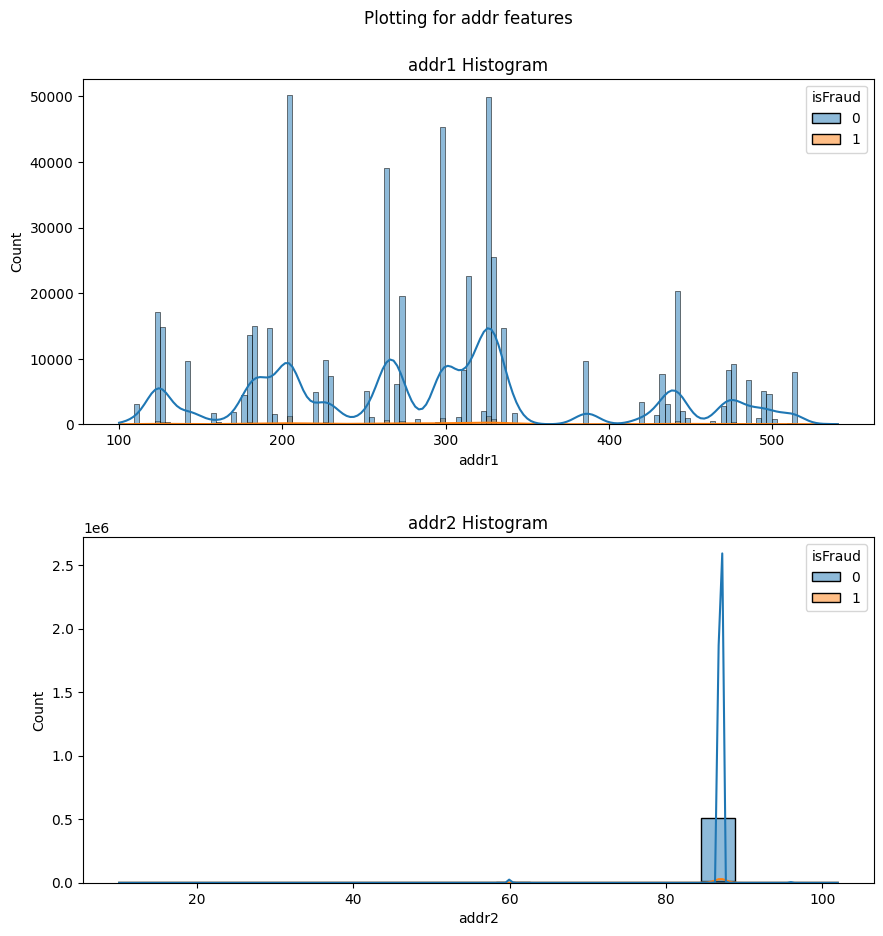

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(10, 10))
fig.tight_layout(pad=6.0)
fig.suptitle('Plotting for addr features')
idx = 0

for i in range(2):

        if(idx==len(addr_features)):
            break

        f = addr_features[idx]
        idx+=1

        sns.histplot(x=f,hue='isFraud', data=train_data, ax=axes[i], kde=True)
        axes[i].set_title(f+" Histogram")

In [ ]:
domain_features = ['P_emaildomain', 'R_emaildomain']

In [ ]:
for f in domain_features:
    print('\n',"*"*10,f,"*"*10,'\n')
    print(train_data[f].describe())
    if(train_data[f].dtype != object):
        len_unique_cat = len(np.unique(train_data[f]))
        print("\n{} feature has {} unique categories\n".format(f, len_unique_cat))


 ********** P_emaildomain ********** 

count        590540
unique           60
top       gmail.com
freq         228355
Name: P_emaildomain, dtype: object

 ********** R_emaildomain ********** 

count     590540
unique        61
top          NaN
freq      453249
Name: R_emaildomain, dtype: object


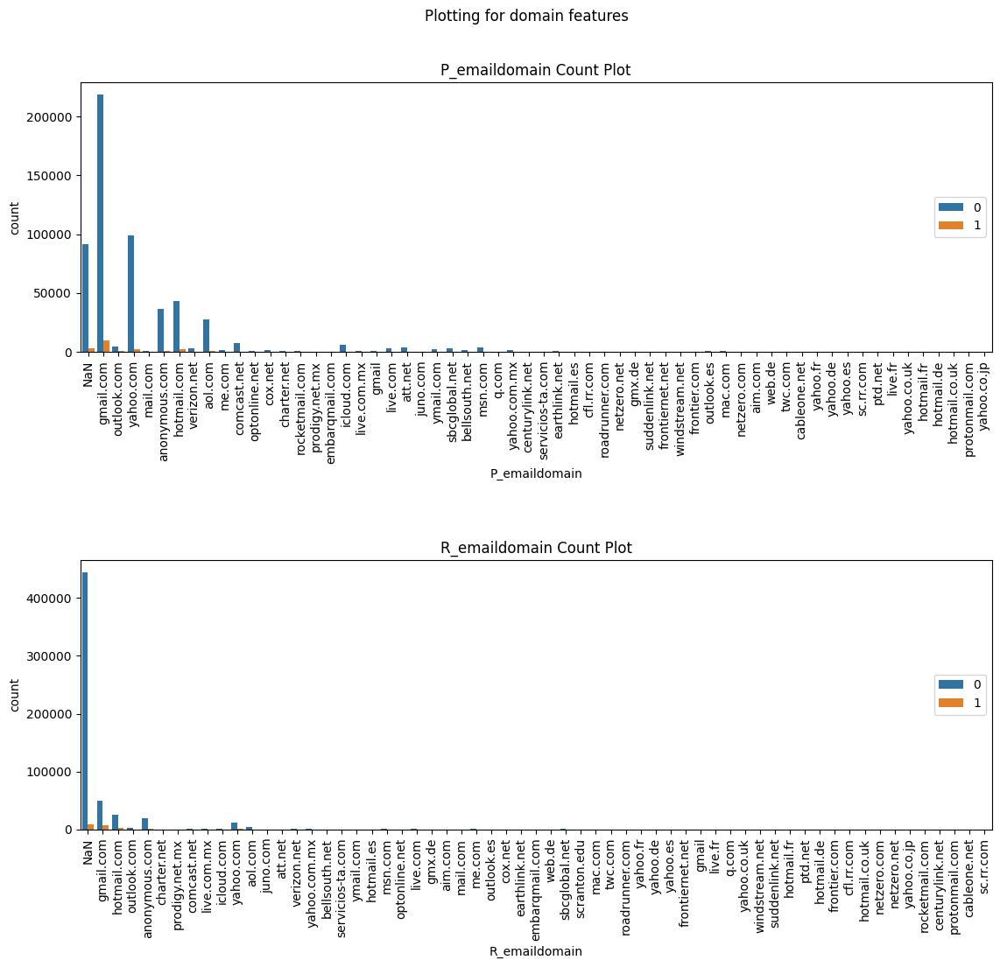

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(15, 13))

fig.tight_layout(pad=15.0)
fig.suptitle('Plotting for domain features', y=0.9)
idx = 0

for i in range(2):

        if(idx==len(domain_features)):
            break

        f = domain_features[idx]
        idx+=1

        sns.countplot(x=f,hue='isFraud', data=train_data, ax=axes[i])

        axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90, ha='center')
        axes[i].legend(loc=7)
        axes[i].set_title(f+" Count Plot")

In [ ]:
m_features = ["M"+str(i) for i in range(1,10) if "M"+str(i) in catf]

In [ ]:
for f in m_features:
    print('\n',"*"*10,f,"*"*10,'\n')
    print(train_data[f].describe())
    if(train_data[f].dtype != object):
        len_unique_cat = len(np.unique(train_data[f]))
        print("\n{} feature has {} unique categories\n".format(f, len_unique_cat))


 ********** M1 ********** 

count     590540
unique         3
top            T
freq      319415
Name: M1, dtype: object

 ********** M2 ********** 

count     590540
unique         3
top            T
freq      285468
Name: M2, dtype: object

 ********** M3 ********** 

count     590540
unique         3
top          NaN
freq      271100
Name: M3, dtype: object

 ********** M4 ********** 

count     590540
unique         4
top          NaN
freq      281444
Name: M4, dtype: object

 ********** M5 ********** 

count     590540
unique         3
top          NaN
freq      350482
Name: M5, dtype: object

 ********** M6 ********** 

count     590540
unique         3
top            F
freq      227856
Name: M6, dtype: object

 ********** M7 ********** 

count     590540
unique         3
top          NaN
freq      346265
Name: M7, dtype: object

 ********** M8 ********** 

count     590540
unique         3
top          NaN
freq      346252
Name: M8, dtype: object

 ********** M9 ********** 

cou

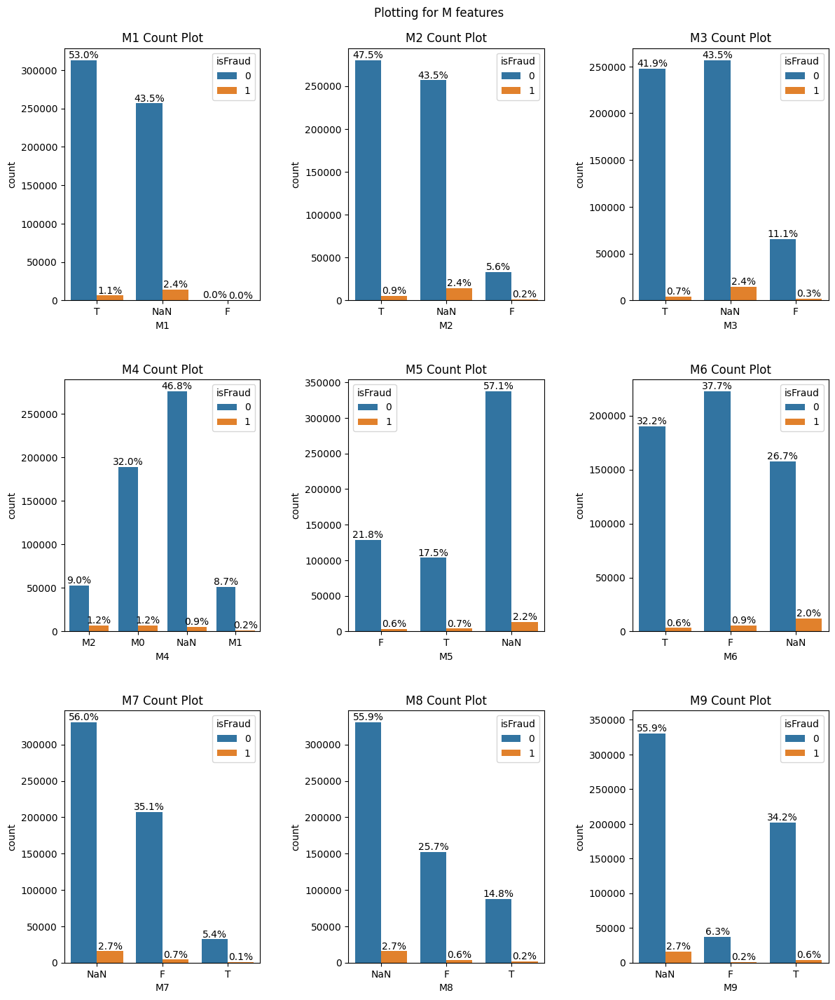

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(13, 15))

fig.tight_layout(pad=6.0)
fig.suptitle('Plotting for M features')
idx = 0

plt.margins(0.05, 0.1)

for i in range(3):
    for j in range(3):

        if(idx==len(m_features)):
            break

        f = m_features[idx]
        idx+=1

        sns.countplot(x=f,hue='isFraud', data=train_data, ax=axes[i,j])

        for p in axes[i,j].patches:
              x=p.get_bbox().get_points()[:,0]
              y=p.get_bbox().get_points()[1,1]
              axes[i,j].annotate('{:.1f}%'.format(100.*y/len(train_data)), (x.mean(), y),
                      ha='center', va='bottom')

        axes[i,j].set_title(f+" Count Plot")

In [ ]:
train_data[['DeviceType']].describe()

,DeviceType
count,590540
unique,3
top,NaN
freq,449730


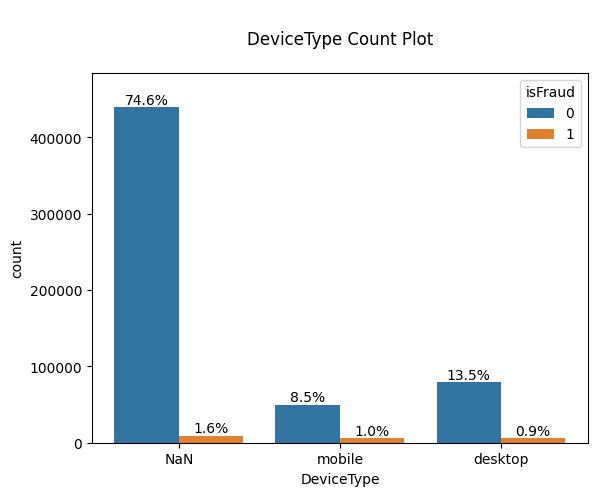

In [ ]:
ax = sns.countplot(x='DeviceType', hue='isFraud', data = train_data)

plt.margins(0.05, 0.1)

for p in ax.patches:
              x=p.get_bbox().get_points()[:,0]
              y=p.get_bbox().get_points()[1,1]
              ax.annotate('{:.1f}%'.format(100.*y/len(train_data)), (x.mean(), y),
                      ha='center', va='bottom')

plt.title('\nDeviceType Count Plot\n')
plt.show()

In [ ]:
train_data[['DeviceInfo']].describe()

,DeviceInfo
count,590540
unique,1787
top,NaN
freq,471874


In [ ]:
plt.figure(figsize=(250,10))
ax = sns.countplot(x='DeviceInfo', hue='isFraud', data=train_data)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center')
plt.title('\nDeviceInfo Count Plot\n')
plt.tight_layout()
plt.show()

In [ ]:
# Top 50 DeviceInfo Value Counts

train_data['DeviceInfo'].value_counts()[:50]

NaN                                    471874
Windows                                 47722
iOS Device                              19782
MacOS                                   12573
Trident/7.0                              7440
rv:11.0                                  1901
rv:57.0                                   962
SM-J700M Build/MMB29K                     549
SM-G610M Build/MMB29K                     461
SM-G531H Build/LMY48B                     410
rv:59.0                                   362
SM-G935F Build/NRD90M                     334
SM-G955U Build/NRD90M                     328
SM-G532M Build/MMB29T                     316
ALE-L23 Build/HuaweiALE-L23               312
SM-G950U Build/NRD90M                     290
SM-G930V Build/NRD90M                     274
rv:58.0                                   269
rv:52.0                                   256
SAMSUNG                                   235
SM-G950F Build/NRD90M                     225
Moto G (4) Build/NPJ25.93-14.7    

In [ ]:
id_features = ["id_"+str(i) for i in range(12, 39) if "id_"+str(i) in catf]

In [ ]:
for f in id_features:
    print('\n',"*"*10,f,"*"*10,'\n')
    print(train_data[f].describe())
    if(train_data[f].dtype != object):
        len_unique_cat = len(np.unique(train_data[f]))
        print("\n{} feature has {} unique categories\n".format(f, len_unique_cat))


 ********** id_12 ********** 

count     590540
unique         3
top          NaN
freq      446307
Name: id_12, dtype: object

 ********** id_13 ********** 

count    127320.000000
mean         48.053071
std          11.774858
min          10.000000
25%          49.000000
50%          52.000000
75%          52.000000
max          64.000000
Name: id_13, dtype: float64

id_13 feature has 55 unique categories


 ********** id_14 ********** 

count    80044.000000
mean      -344.507146
std         93.695502
min       -660.000000
25%       -360.000000
50%       -300.000000
75%       -300.000000
max        720.000000
Name: id_14, dtype: float64

id_14 feature has 26 unique categories


 ********** id_15 ********** 

count     590540
unique         4
top          NaN
freq      449555
Name: id_15, dtype: object

 ********** id_16 ********** 

count     590540
unique         3
top          NaN
freq      461200
Name: id_16, dtype: object

 ********** id_17 ********** 

count    139369.000000
me

In [ ]:
fig, axes = plt.subplots(27, figsize=(35, 200))

fig.tight_layout(pad=18.0)
fig.suptitle('Plotting for id features')
idx = 0

for i in range(27):

        if(idx==len(id_features)):
            break

        f = id_features[idx]
        idx+=1

        if(train_data[f].dtype == object):
            sns.countplot(x=f,hue='isFraud', data=train_data, ax=axes[i])
            axes[i].set_title(f+" Count Plot")

            if(len(train_data[f].unique())>10):
                axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90, ha='center')

        else:
            sns.histplot(x=f,hue='isFraud', data=train_data, ax=axes[i], kde=True)
            axes[i].set_title(f+" Histogram")

In [ ]:
# We have the followig Quantitative Features

print(numf)

['TransactionID', 'TransactionDT', 'TransactionAmt', 'dist1', 'dist2', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V10

In [ ]:
train_data[['TransactionDT']].describe().astype(int)

,TransactionDT
count,590540
mean,7372311
std,4617223
min,86400
25%,3027057
50%,7306527
75%,11246620
max,15811131


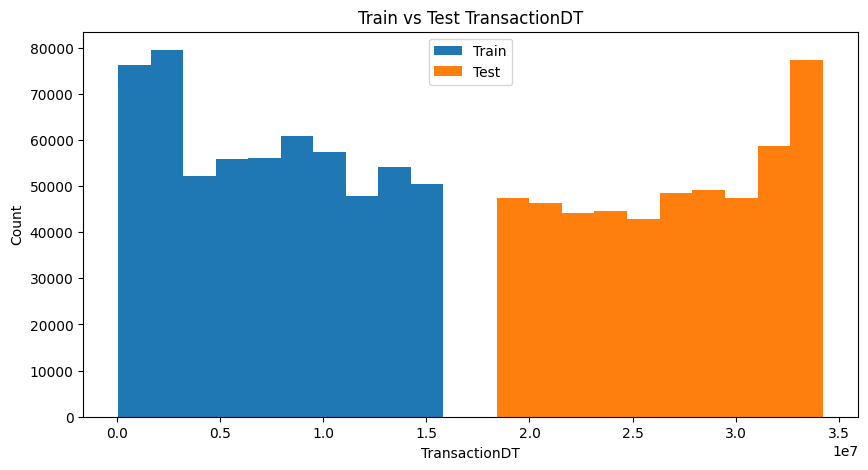

In [ ]:
plt.figure(figsize=(10,5))
plt.hist(x = 'TransactionDT', data = train_data, label='Train')
plt.hist(x = 'TransactionDT', data = test_data, label='Test')
plt.title("Train vs Test TransactionDT")
plt.xlabel("TransactionDT")
plt.ylabel("Count")
plt.legend()
plt.show()

In [ ]:
train_data[['TransactionAmt']].describe()

,TransactionAmt
count,590540.000000
mean,135.027176
std,239.162522
min,0.251000
25%,43.321000
50%,68.769000
75%,125.000000
max,31937.391000


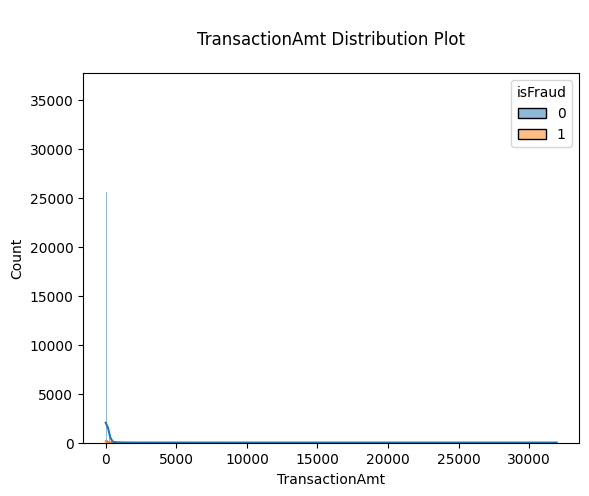

In [ ]:
sns.histplot(x='TransactionAmt', hue='isFraud', data=train_data, kde=True)
plt.title('\nTransactionAmt Distribution Plot\n')
plt.show()

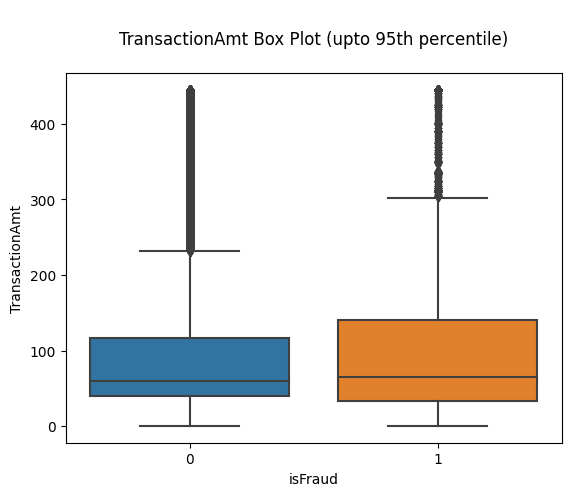

In [ ]:
sns.boxplot(y='TransactionAmt', x='isFraud', data=train_data[train_data['TransactionAmt']<=np.percentile(train_data['TransactionAmt'], 95)])
plt.title('\nTransactionAmt Box Plot (upto 95th percentile)\n')
plt.show()

In [ ]:
c_features = ["C"+str(i) for i in range(1,15) if "C"+str(i) in numf]

In [ ]:
for f in c_features:
    print('\n',"*"*10,f,"*"*10,'\n')
    print(train_data[f].describe())
    len_unique_cat = len(np.unique(train_data[f]))
    print("\n{} feature has {} unique categories\n".format(f, len_unique_cat))


 ********** C1 ********** 

count    590540.000000
mean         14.092458
std         133.569018
min           0.000000
25%           1.000000
50%           1.000000
75%           3.000000
max        4685.000000
Name: C1, dtype: float64

C1 feature has 1657 unique categories


 ********** C2 ********** 

count    590540.000000
mean         15.269734
std         154.668899
min           0.000000
25%           1.000000
50%           1.000000
75%           3.000000
max        5691.000000
Name: C2, dtype: float64

C2 feature has 1216 unique categories


 ********** C3 ********** 

count    590540.000000
mean          0.005644
std           0.150536
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          26.000000
Name: C3, dtype: float64

C3 feature has 27 unique categories


 ********** C4 ********** 

count    590540.000000
mean          4.092185
std          68.848459
min           0.000000
25%           0.000000
50%           0.000000
7

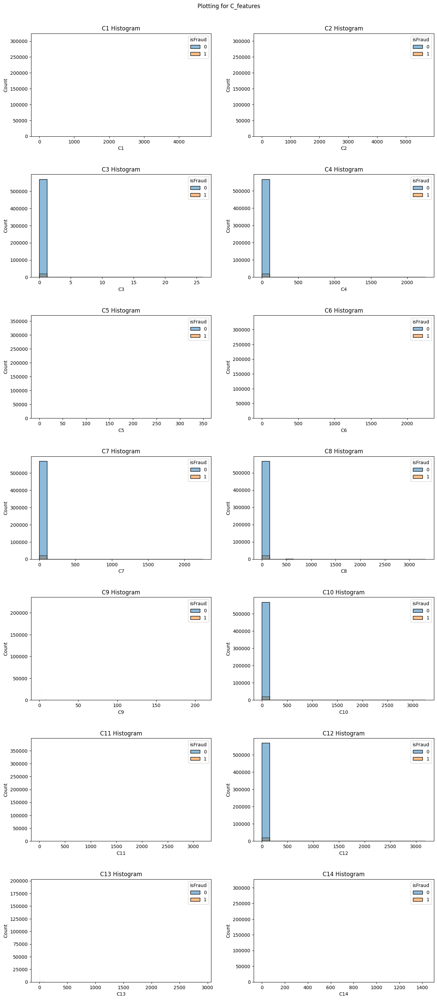

In [ ]:
fig, axes = plt.subplots(7, 2, figsize=(14, 30))

fig.tight_layout(pad=6.0)
fig.suptitle('Plotting for C_features', y=1)
idx = 0

for i in range(7):
    for j in range(2):

        if(idx==len(c_features)):
            break

        f = c_features[idx]
        idx+=1

        sns.histplot(x=f, hue='isFraud', data=train_data, ax=axes[i,j])
        axes[i,j].set_title(f+" Histogram")

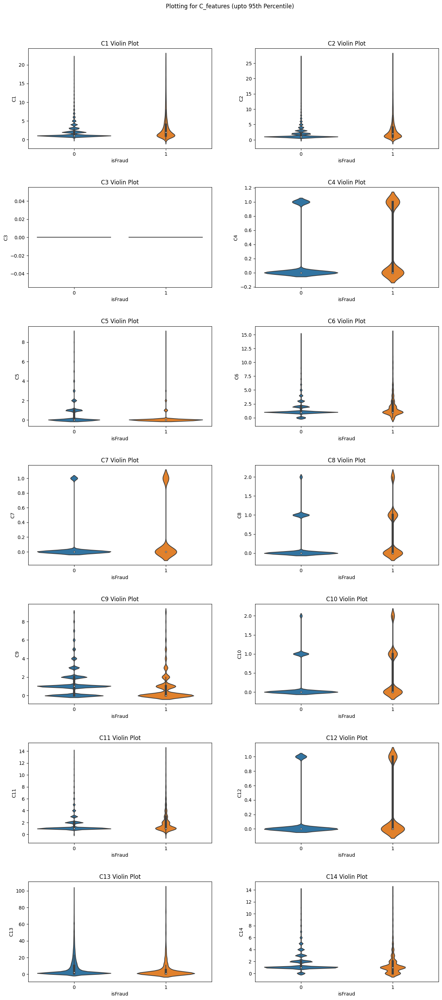

In [ ]:
fig, axes = plt.subplots(7, 2, figsize=(14, 30))

fig.suptitle('Plotting for C_features (upto 95th Percentile)')
fig.tight_layout(pad=6.0)
idx = 0

for i in range(7):
    for j in range(2):

        if(idx==len(c_features)):
            break

        f = c_features[idx]
        idx+=1

        sns.violinplot(y=f, x='isFraud', data=train_data[train_data[f]<=np.percentile(train_data[f], 95)], ax=axes[i,j])
        axes[i,j].set_title(f+" Violin Plot")

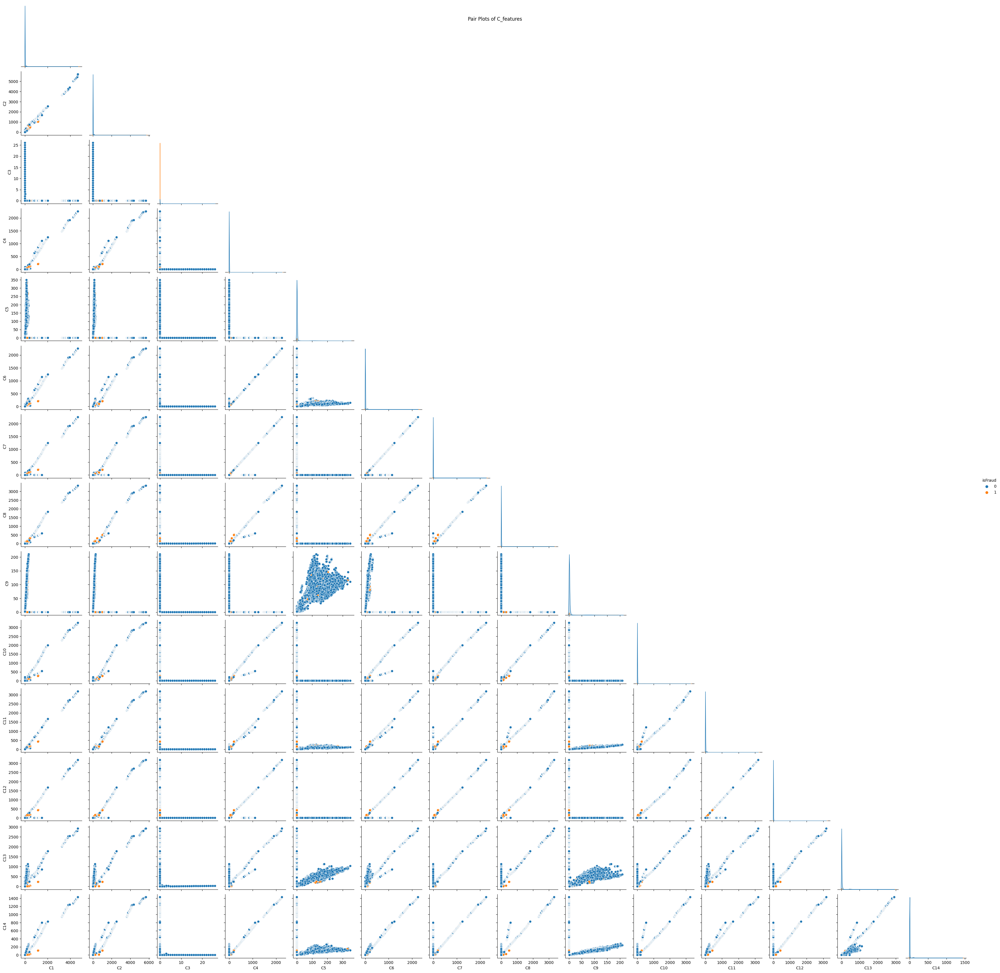

In [ ]:
sns.pairplot(vars = c_features, hue = 'isFraud' , data = train_data, corner=True)
plt.suptitle("\nPair Plots of C_features\n")
plt.show()

In [ ]:
d_features = ["D"+str(i) for i in range(1,16) if "D"+str(i) in numf]

In [ ]:
for f in d_features:
    print('\n',"*"*10,f,"*"*10,'\n')
    print(train_data[f].describe())
    len_unique_cat = len(np.unique(train_data[f]))
    print("\n{} feature has {} unique categories\n".format(f, len_unique_cat))


 ********** D1 ********** 

count    589271.000000
mean         94.347568
std         157.660387
min           0.000000
25%           0.000000
50%           3.000000
75%         122.000000
max         640.000000
Name: D1, dtype: float64

D1 feature has 642 unique categories


 ********** D2 ********** 

count    309743.000000
mean        169.563231
std         177.315865
min           0.000000
25%          26.000000
50%          97.000000
75%         276.000000
max         640.000000
Name: D2, dtype: float64

D2 feature has 642 unique categories


 ********** D3 ********** 

count    327662.000000
mean         28.343348
std          62.384721
min           0.000000
25%           1.000000
50%           8.000000
75%          27.000000
max         819.000000
Name: D3, dtype: float64

D3 feature has 650 unique categories


 ********** D4 ********** 

count    421618.000000
mean        140.002441
std         191.096774
min        -122.000000
25%           0.000000
50%          26.000000
75

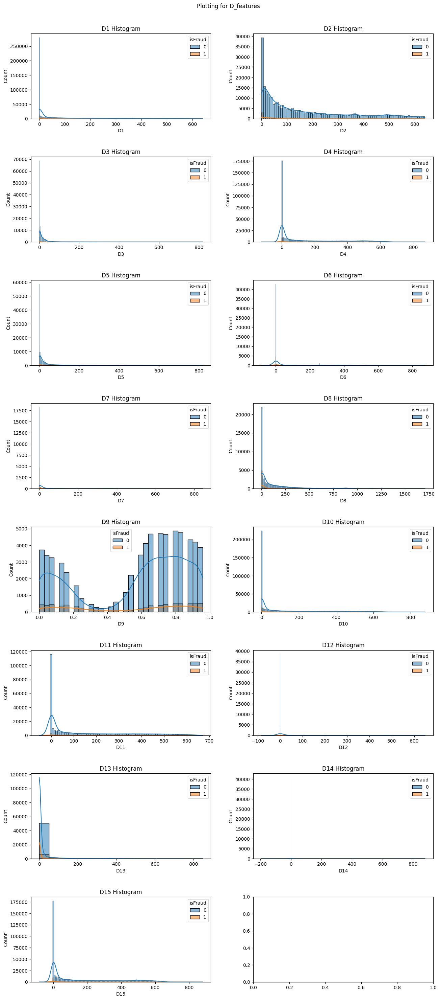

In [ ]:
fig, axes = plt.subplots(8, 2, figsize=(14, 30))

fig.tight_layout(pad=6.0)
fig.suptitle('Plotting for D_features', y=1)
idx = 0

for i in range(8):
    for j in range(2):

        if(idx==len(d_features)):
            break

        f = d_features[idx]
        idx+=1

        sns.histplot(x=f,hue='isFraud', data=train_data, ax=axes[i,j], kde=True)
        axes[i,j].set_title(f+" Histogram")

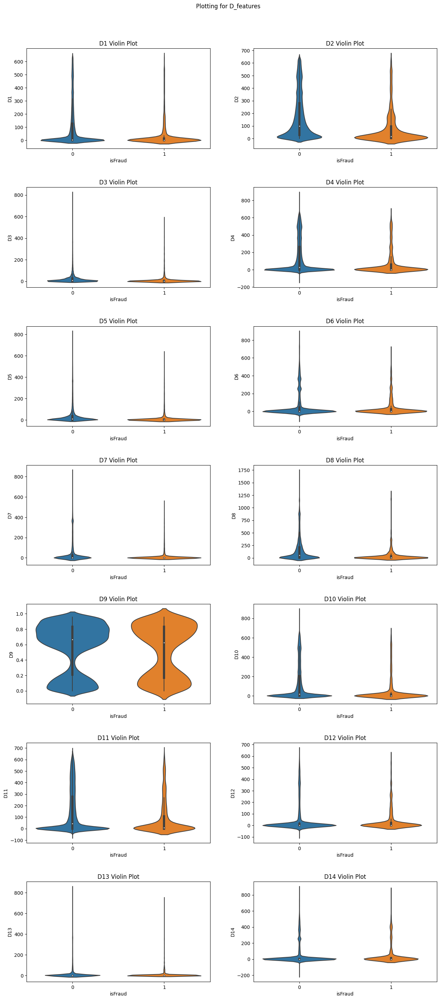

In [ ]:
fig, axes = plt.subplots(7, 2, figsize=(14, 30))

fig.suptitle('Plotting for D_features')
fig.tight_layout(pad=6.0)
idx = 0

for i in range(7):
    for j in range(2):

        if(idx==len(d_features)):
            break

        f = d_features[idx]
        idx+=1

        sns.violinplot(y=f, x='isFraud', data=train_data, ax=axes[i,j], kde=True)
        axes[i,j].set_title(f+" Violin Plot")

In [ ]:
sns.pairplot(vars = d_features, hue='isFraud', data = train_data, corner=True)
plt.suptitle("\nPair Plots of D_features\n")
plt.show()

In [ ]:
id_num_features = ['id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06', 'id_07', 'id_08', 'id_09', 'id_10', 'id_11']

In [ ]:
for f in id_num_features:
    print('\n',"*"*10,f,"*"*10,'\n')
    print(train_data[f].describe())
    len_unique_cat = len(np.unique(train_data[f]))
    print("\n{} feature has {} unique categories\n".format(f, len_unique_cat))


 ********** id_01 ********** 

count    144233.000000
mean        -10.170502
std          14.347949
min        -100.000000
25%         -10.000000
50%          -5.000000
75%          -5.000000
max           0.000000
Name: id_01, dtype: float64

id_01 feature has 78 unique categories


 ********** id_02 ********** 

count    140872.000000
mean     174716.584708
std      159651.816856
min           1.000000
25%       67992.000000
50%      125800.500000
75%      228749.000000
max      999595.000000
Name: id_02, dtype: float64

id_02 feature has 115656 unique categories


 ********** id_03 ********** 

count    66324.000000
mean         0.060189
std          0.598231
min        -13.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         10.000000
Name: id_03, dtype: float64

id_03 feature has 25 unique categories


 ********** id_04 ********** 

count    66324.000000
mean        -0.058938
std          0.701015
min        -28.000000
25%          0.000000
50%    

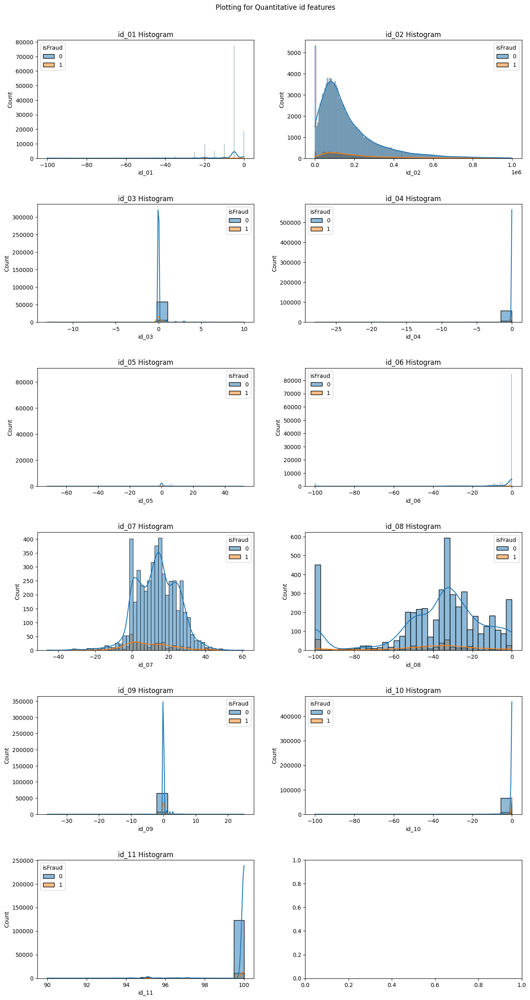

In [ ]:
fig, axes = plt.subplots(6, 2, figsize=(14, 25))

fig.tight_layout(pad=6.0)
fig.suptitle('Plotting for Quantitative id features', y=1)
idx = 0

for i in range(6):
    for j in range(2):

        if(idx==len(id_num_features)):
            break

        f = id_num_features[idx]
        idx+=1

        sns.histplot(x=f,hue='isFraud', data=train_data, ax=axes[i,j], kde=True)
        axes[i,j].set_title(f+" Histogram")

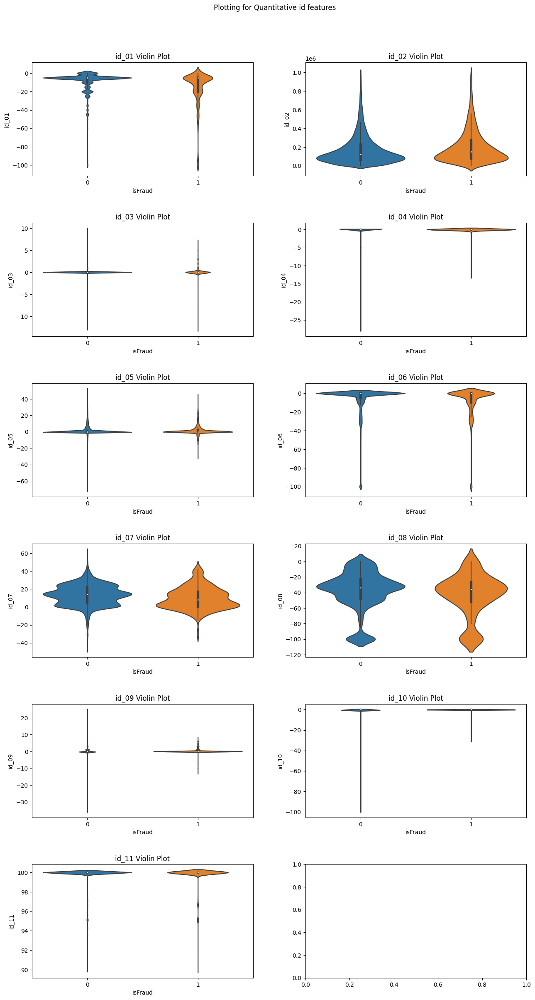

In [ ]:
fig, axes = plt.subplots(6, 2, figsize=(14, 25))

fig.suptitle('Plotting for Quantitative id features')
fig.tight_layout(pad=6.0)
idx = 0

for i in range(6):
    for j in range(2):

        if(idx==len(id_num_features)):
            break

        f = id_num_features[idx]
        idx+=1

        sns.violinplot(y=f, x='isFraud', data=train_data, ax=axes[i,j], kde=True)
        axes[i,j].set_title(f+" Violin Plot")

In [ ]:
sns.pairplot(vars = id_num_features, hue='isFraud', data = train_data, corner=True)
plt.suptitle("\nPair Plots of id_num_features\n")
plt.show()

In [ ]:
v_features = ["V"+str(i) for i in range(1,340) if "V"+str(i) in numf]

In [ ]:
for f in v_features:
    print('\n',"*"*10,f,"*"*10,'\n')
    print(train_data[f].describe())
    len_unique_cat = len(np.unique(train_data[f]))
    print("\n{} feature has {} unique categories\n".format(f, len_unique_cat))

Streaming output truncated to the last 5000 lines.
max           9.000000
Name: V6, dtype: float64

V6 feature has 11 unique categories


 ********** V7 ********** 

count    311253.000000
mean          1.072870
std           0.304779
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max           9.000000
Name: V7, dtype: float64

V7 feature has 11 unique categories


 ********** V8 ********** 

count    311253.000000
mean          1.027704
std           0.186069
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max           8.000000
Name: V8, dtype: float64

V8 feature has 10 unique categories


 ********** V9 ********** 

count    311253.000000
mean          1.041529
std           0.226339
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max           8.000000
Name: V9, dtype: float64

V9 feature has 10 unique categories


 ********** V10 ********** 

count

In [ ]:
fig, axes = plt.subplots(113, 3, figsize=(14, 450))

fig.suptitle('Plotting for V_features', y=1)
fig.tight_layout(pad=6.0)
idx = 0

for i in range(113):
    for j in range(3):

        if(idx==len(v_features)):
            break

        f = v_features[idx]
        idx+=1

        sns.violinplot(y=f, x='isFraud', data=train_data, ax=axes[i,j])
        axes[i,j].set_title(f+" Violin Plot")

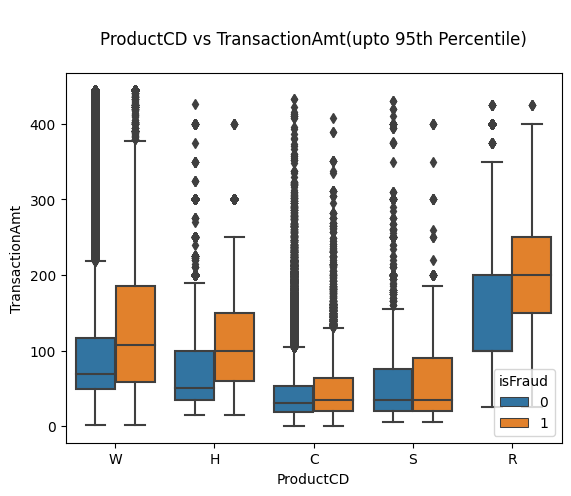

In [ ]:
sns.boxplot(x='ProductCD', y='TransactionAmt', data=train_data[train_data['TransactionAmt']<=np.percentile(train_data['TransactionAmt'], 95)], hue='isFraud')
plt.title('\nProductCD vs TransactionAmt(upto 95th Percentile)\n')
plt.show()

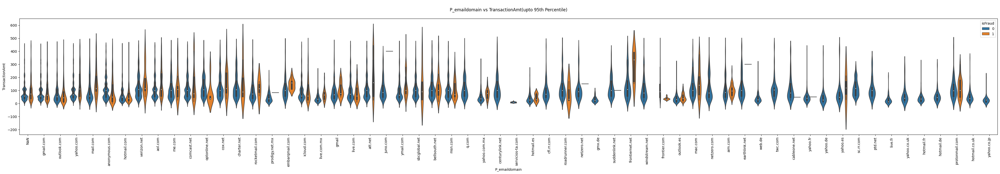

In [ ]:
plt.figure(figsize=(50,6))
ax = sns.violinplot(x='P_emaildomain', y='TransactionAmt', data=train_data[train_data['TransactionAmt']<=np.percentile(train_data['TransactionAmt'], 95)], hue='isFraud', split=False)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center')
plt.title('\nP_emaildomain vs TransactionAmt(upto 95th Percentile)\n')
plt.show()

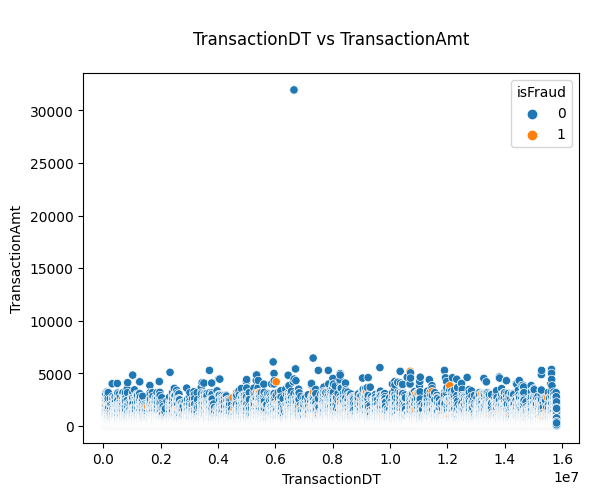

In [ ]:
sns.scatterplot(x='TransactionDT', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nTransactionDT vs TransactionAmt\n")
plt.show()

In [ ]:
# Removing Outlier from the TransactionAmt

train_data = train_data[train_data['TransactionAmt']<30000]

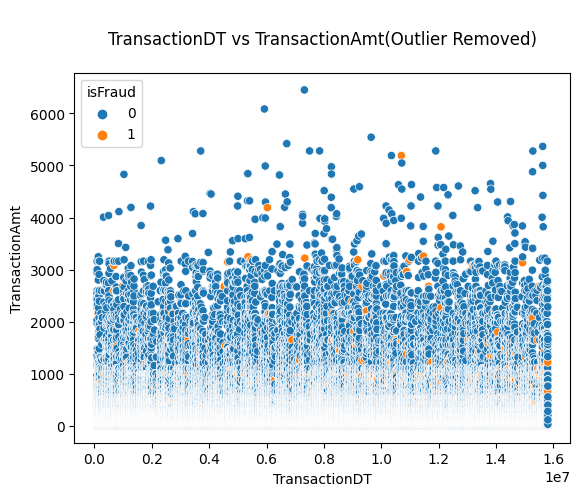

In [ ]:
sns.scatterplot(x='TransactionDT', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nTransactionDT vs TransactionAmt(Outlier Removed)\n")
plt.show()

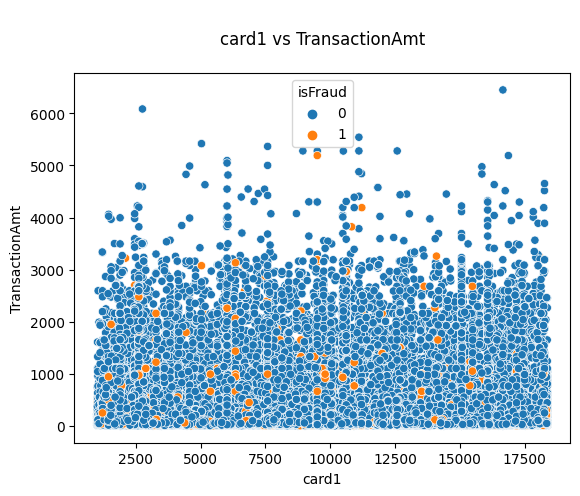

In [ ]:
sns.scatterplot(x='card1', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\ncard1 vs TransactionAmt\n")
plt.show()

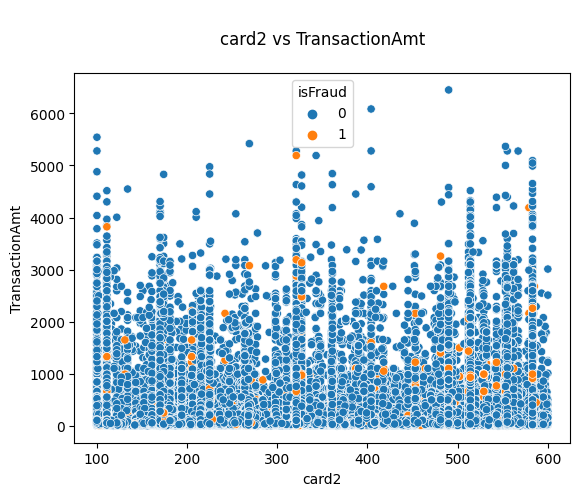

In [ ]:
sns.scatterplot(x='card2', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\ncard2 vs TransactionAmt\n")
plt.show()

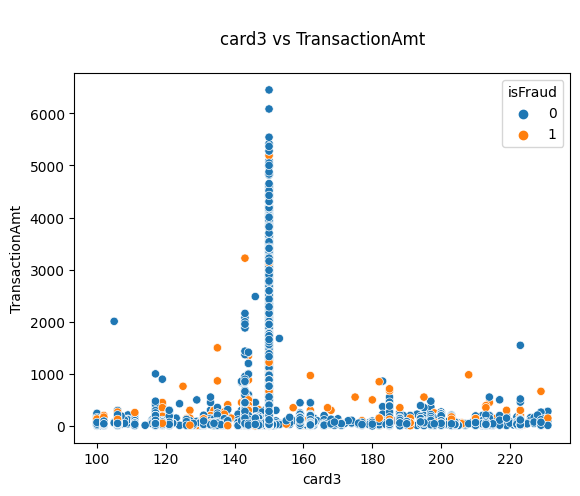

In [ ]:
sns.scatterplot(x='card3', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\ncard3 vs TransactionAmt\n")
plt.show()

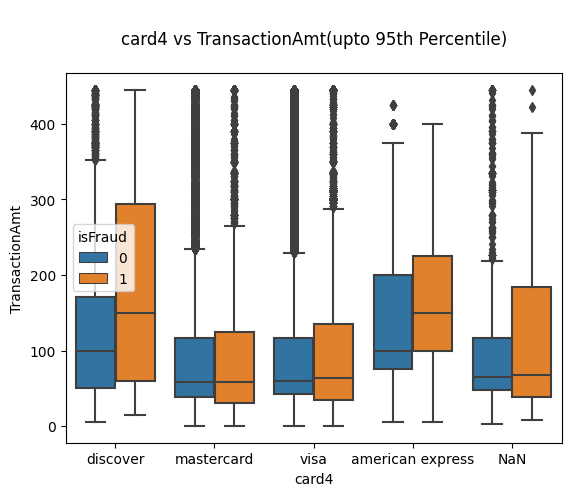

In [ ]:
sns.boxplot(x=train_data['card4'], y='TransactionAmt', hue='isFraud', data=train_data[train_data['TransactionAmt']<=np.percentile(train_data['TransactionAmt'], 95)])
plt.title('\ncard4 vs TransactionAmt(upto 95th Percentile)\n')
plt.show()

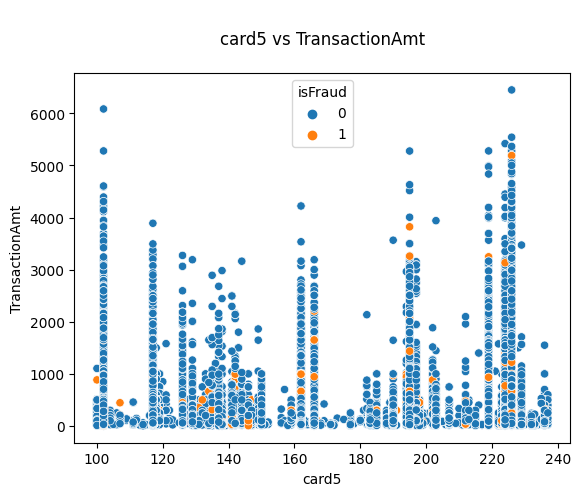

In [ ]:
sns.scatterplot(x='card5', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\ncard5 vs TransactionAmt\n")
plt.show()

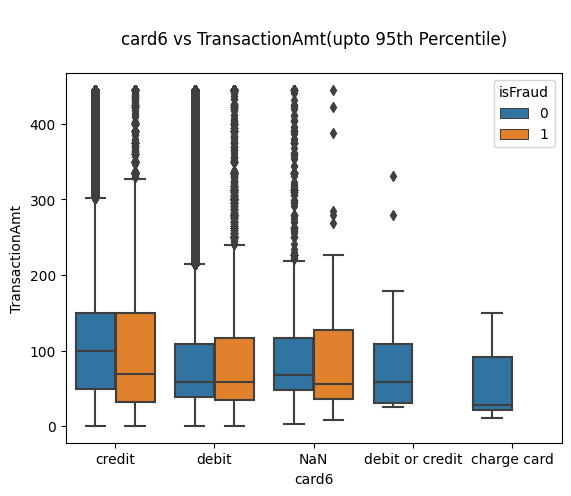

In [ ]:
sns.boxplot(x=train_data['card6'], y='TransactionAmt', hue='isFraud', data=train_data[train_data['TransactionAmt']<=np.percentile(train_data['TransactionAmt'], 95)])
plt.title('\ncard6 vs TransactionAmt(upto 95th Percentile)\n')
plt.show()

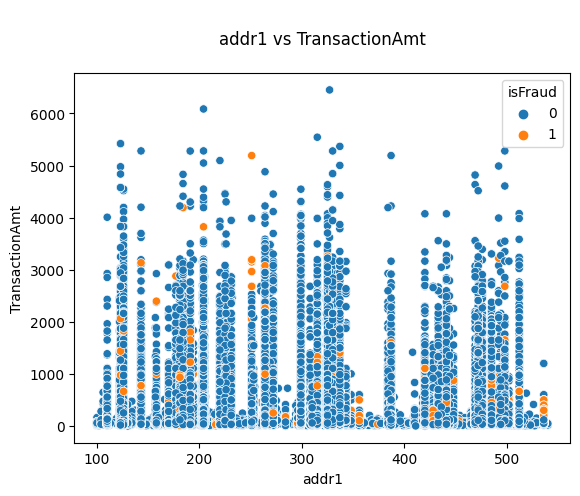

In [ ]:
sns.scatterplot(x='addr1', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\naddr1 vs TransactionAmt\n")
plt.show()

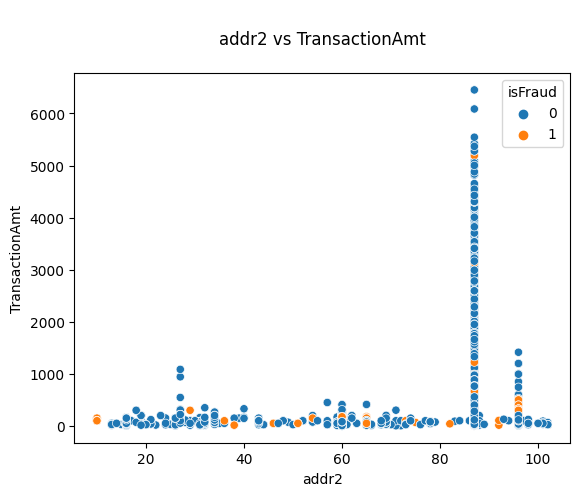

In [ ]:
sns.scatterplot(x='addr2', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\naddr2 vs TransactionAmt\n")
plt.show()

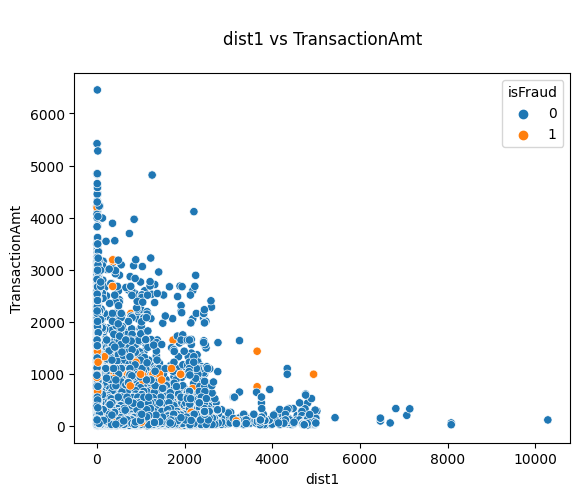

In [ ]:
sns.scatterplot(x='dist1', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\ndist1 vs TransactionAmt\n")
plt.show()

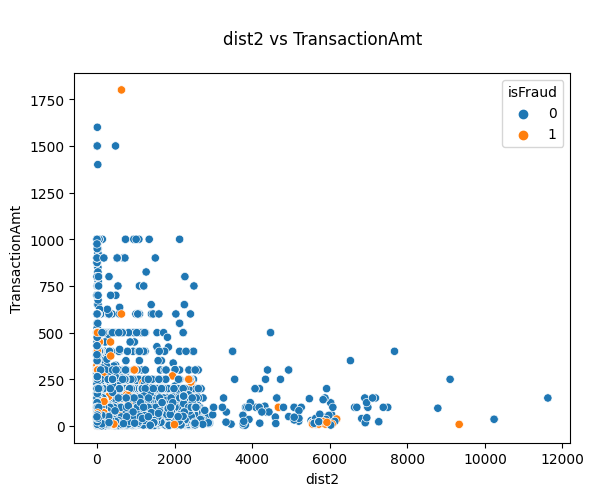

In [ ]:
sns.scatterplot(x='dist2', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\ndist2 vs TransactionAmt\n")
plt.show()

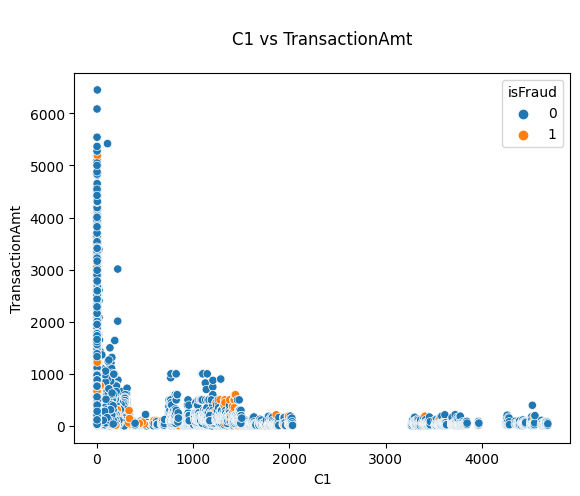

In [ ]:
sns.scatterplot(x='C1', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nC1 vs TransactionAmt\n")
plt.show()

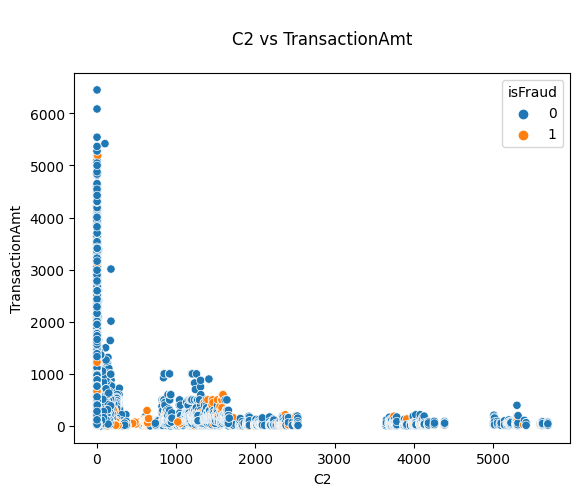

In [ ]:
sns.scatterplot(x='C2', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nC2 vs TransactionAmt\n")
plt.show()

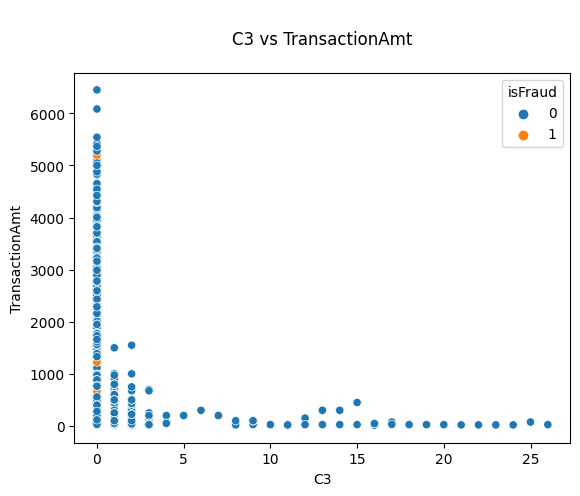

In [ ]:
sns.scatterplot(x='C3', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nC3 vs TransactionAmt\n")
plt.show()

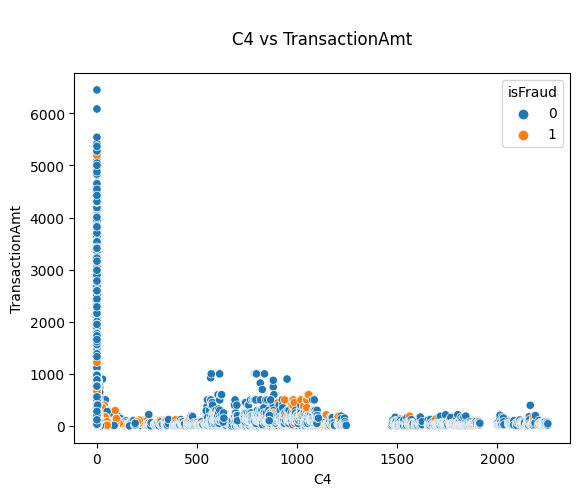

In [ ]:
sns.scatterplot(x='C4', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nC4 vs TransactionAmt\n")
plt.show()

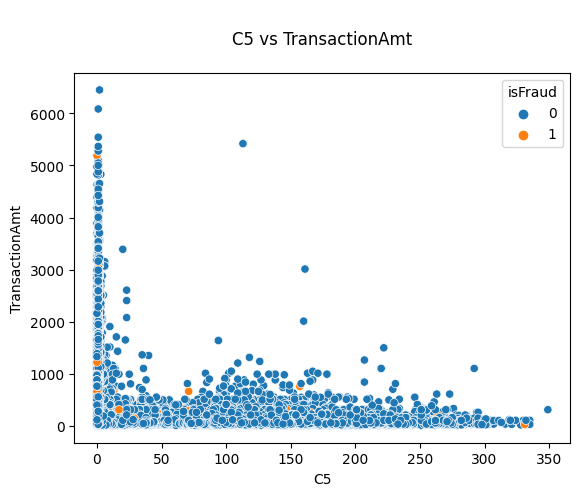

In [ ]:
sns.scatterplot(x='C5', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nC5 vs TransactionAmt\n")
plt.show()

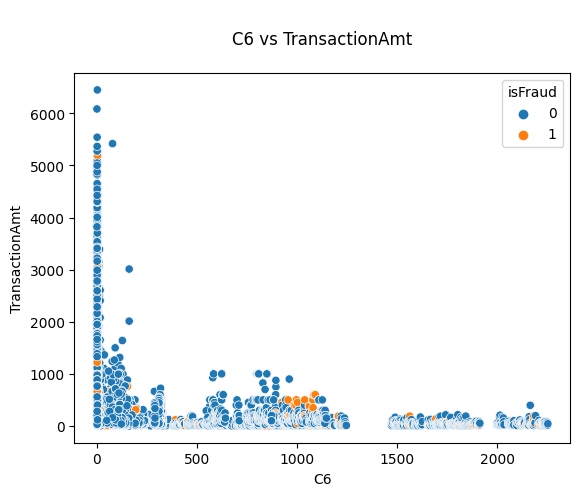

In [ ]:
sns.scatterplot(x='C6', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nC6 vs TransactionAmt\n")
plt.show()

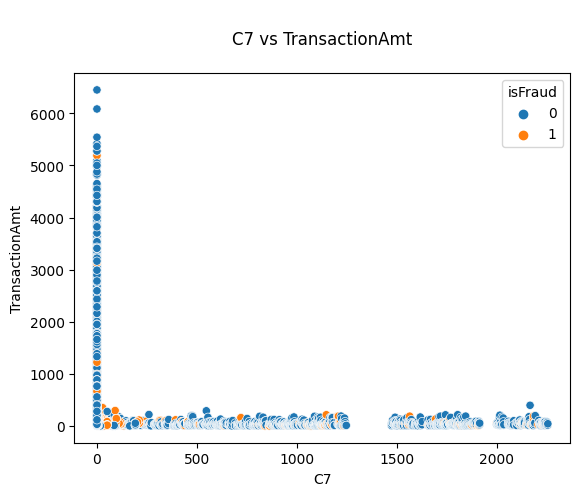

In [ ]:
sns.scatterplot(x='C7', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nC7 vs TransactionAmt\n")
plt.show()

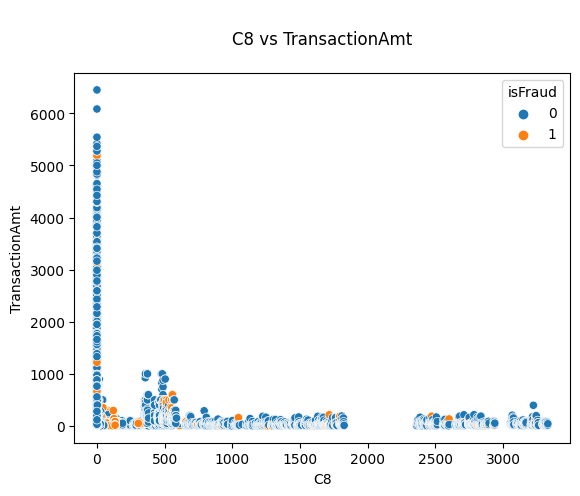

In [ ]:
sns.scatterplot(x='C8', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nC8 vs TransactionAmt\n")
plt.show()

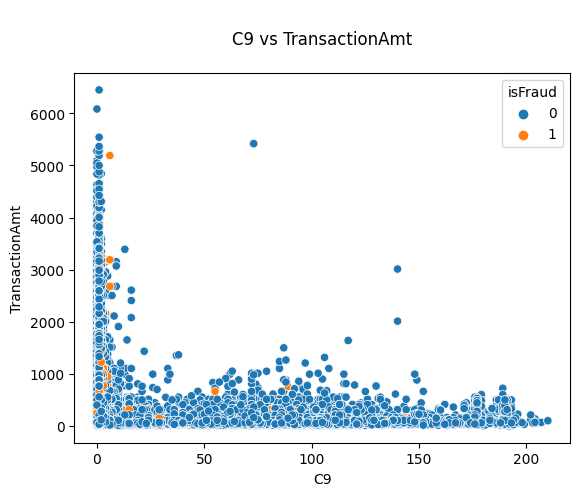

In [ ]:
sns.scatterplot(x='C9', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nC9 vs TransactionAmt\n")
plt.show()

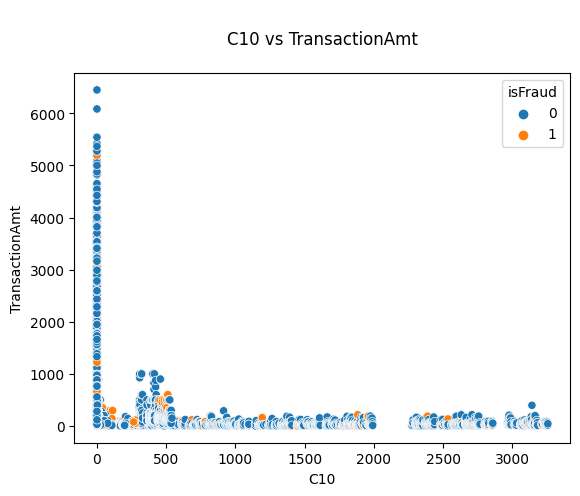

In [ ]:
sns.scatterplot(x='C10', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nC10 vs TransactionAmt\n")
plt.show()

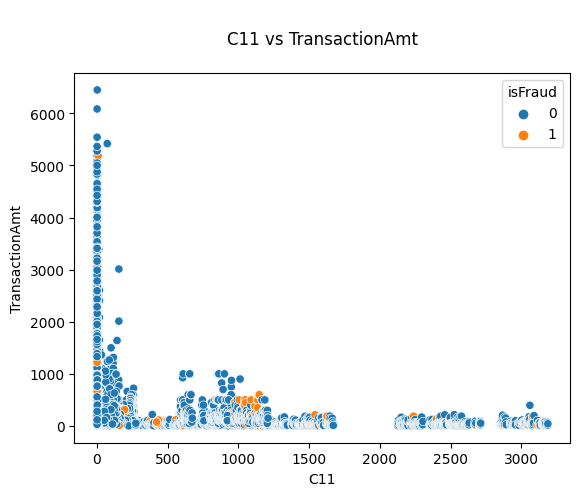

In [ ]:
sns.scatterplot(x='C11', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nC11 vs TransactionAmt\n")
plt.show()

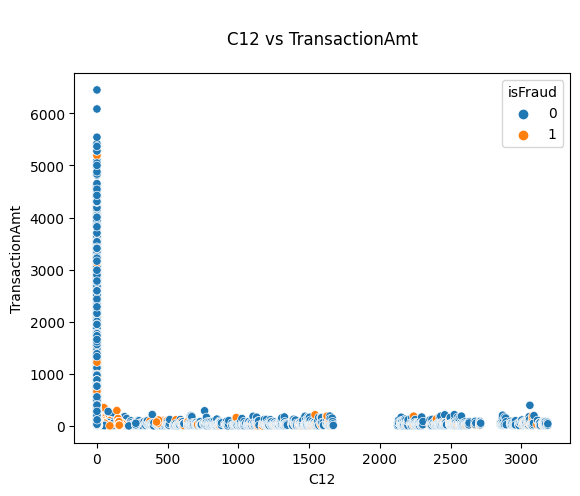

In [ ]:
sns.scatterplot(x='C12', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nC12 vs TransactionAmt\n")
plt.show()

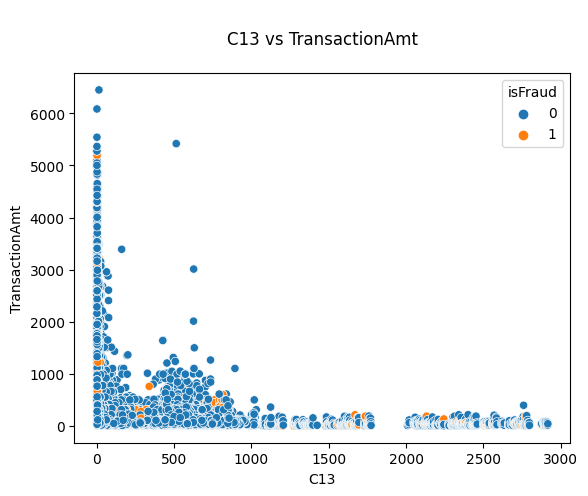

In [ ]:
sns.scatterplot(x='C13', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nC13 vs TransactionAmt\n")
plt.show()

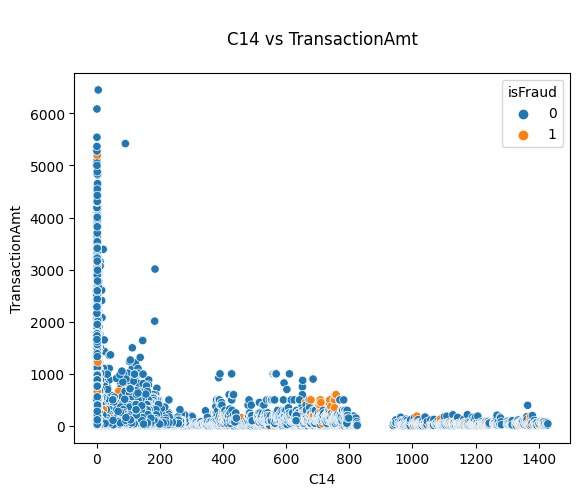

In [ ]:
sns.scatterplot(x='C14', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nC14 vs TransactionAmt\n")
plt.show()

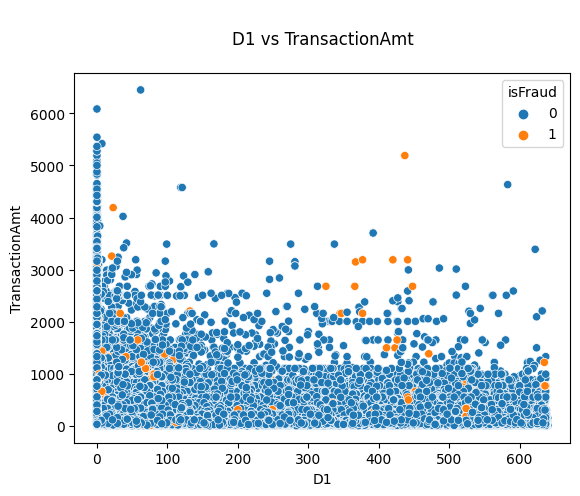

In [ ]:
sns.scatterplot(x='D1', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nD1 vs TransactionAmt\n")
plt.show()

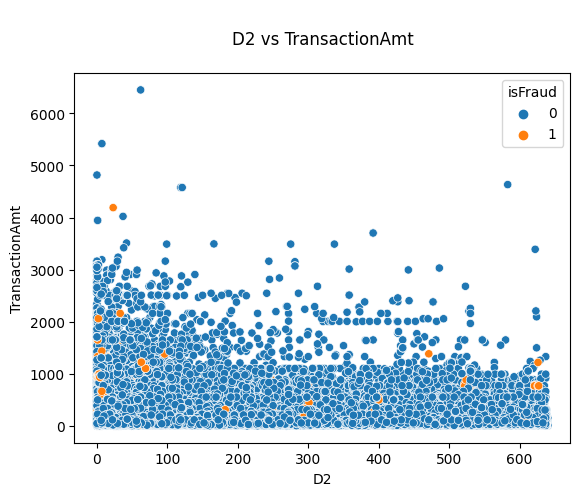

In [ ]:
sns.scatterplot(x='D2', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nD2 vs TransactionAmt\n")
plt.show()

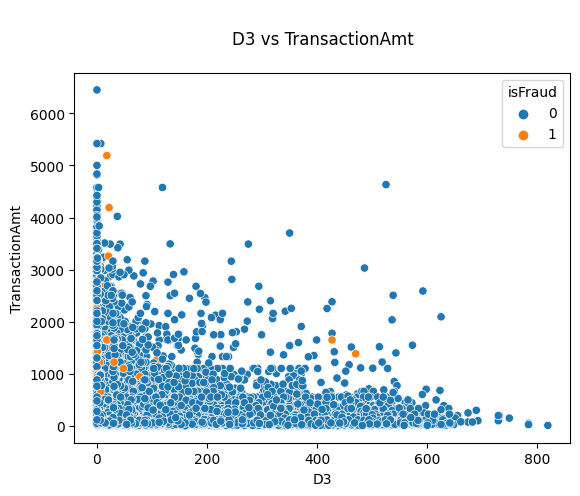

In [ ]:
sns.scatterplot(x='D3', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nD3 vs TransactionAmt\n")
plt.show()

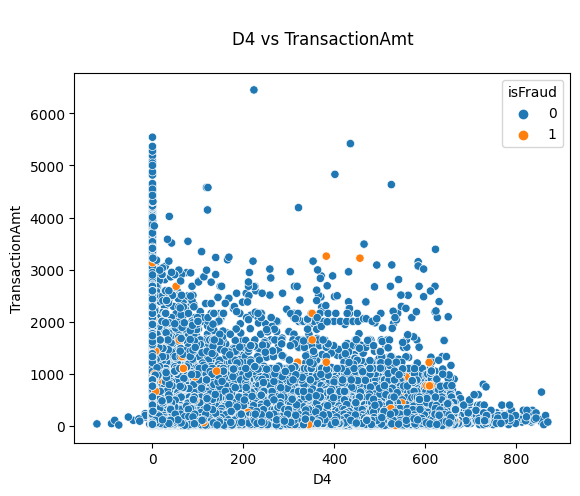

In [ ]:
sns.scatterplot(x='D4', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nD4 vs TransactionAmt\n")
plt.show()

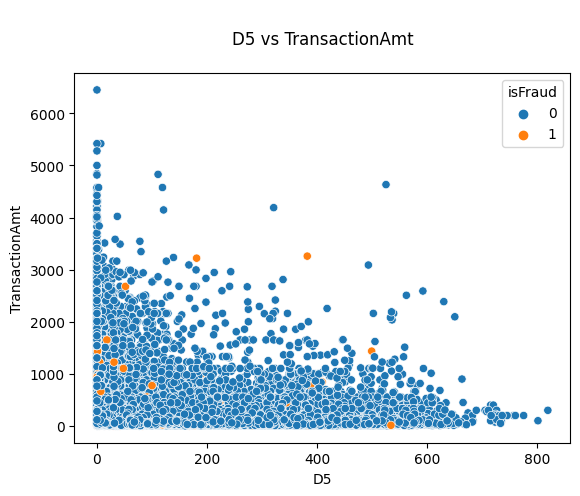

In [ ]:
sns.scatterplot(x='D5', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nD5 vs TransactionAmt\n")
plt.show()

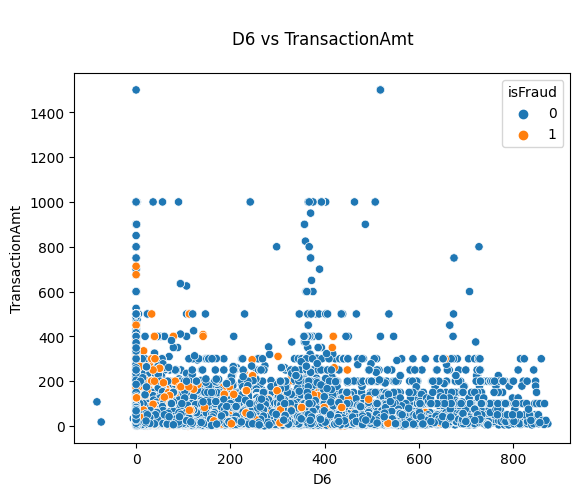

In [ ]:
sns.scatterplot(x='D6', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nD6 vs TransactionAmt\n")
plt.show()

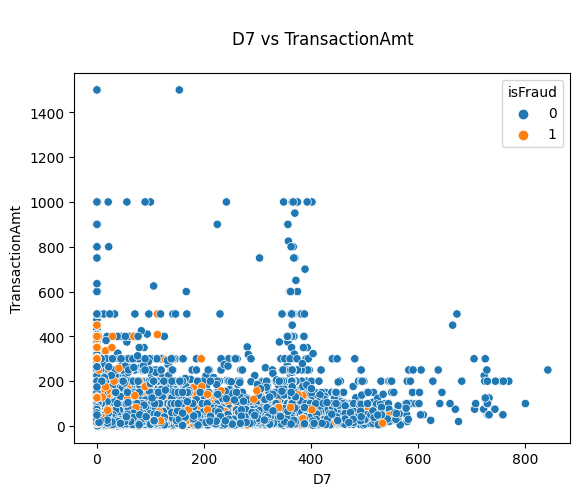

In [ ]:
sns.scatterplot(x='D7', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nD7 vs TransactionAmt\n")
plt.show()

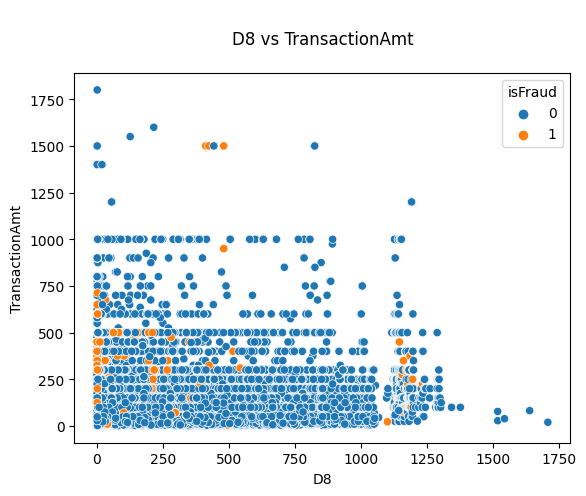

In [ ]:
sns.scatterplot(x='D8', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nD8 vs TransactionAmt\n")
plt.show()

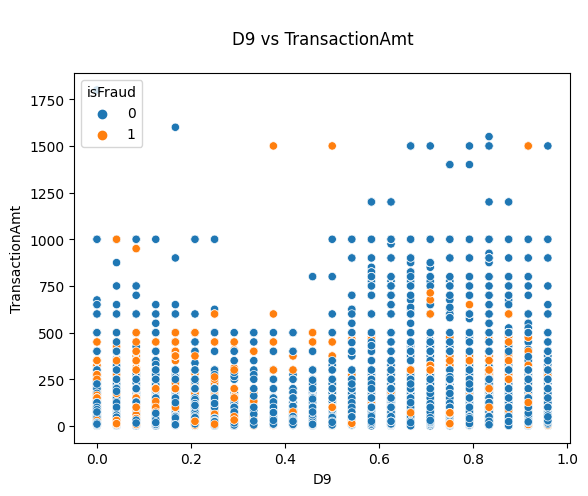

In [ ]:
sns.scatterplot(x='D9', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nD9 vs TransactionAmt\n")
plt.show()

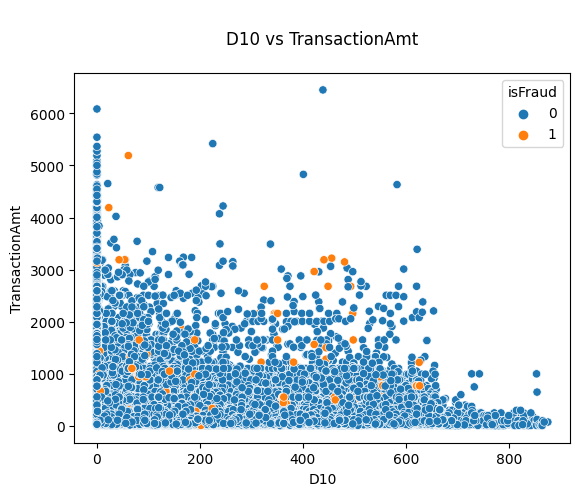

In [ ]:
sns.scatterplot(x='D10', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nD10 vs TransactionAmt\n")
plt.show()

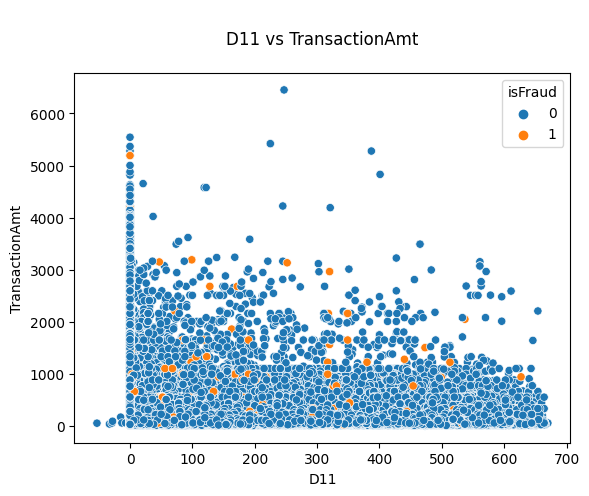

In [ ]:
sns.scatterplot(x='D11', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nD11 vs TransactionAmt\n")
plt.show()

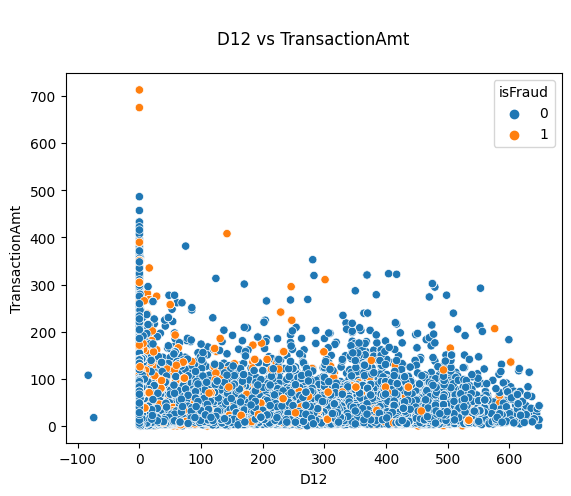

In [ ]:
sns.scatterplot(x='D12', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nD12 vs TransactionAmt\n")
plt.show()

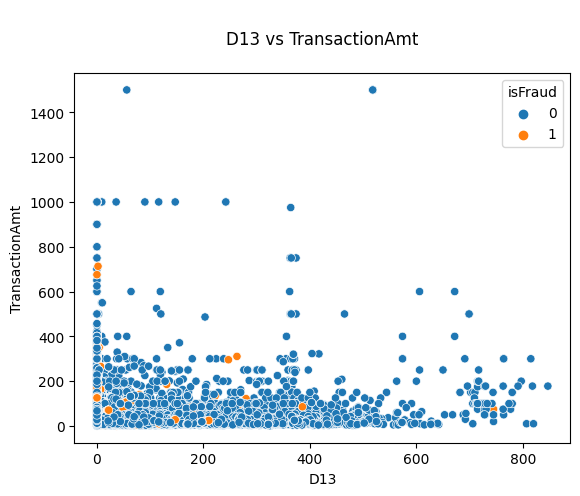

In [ ]:
sns.scatterplot(x='D13', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nD13 vs TransactionAmt\n")
plt.show()

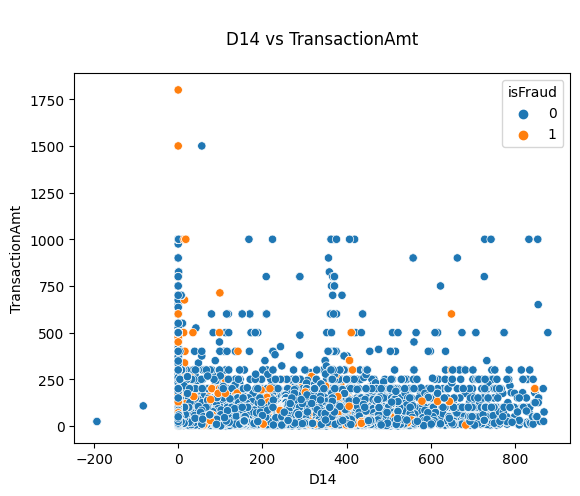

In [ ]:
sns.scatterplot(x='D14', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nD14 vs TransactionAmt\n")
plt.show()

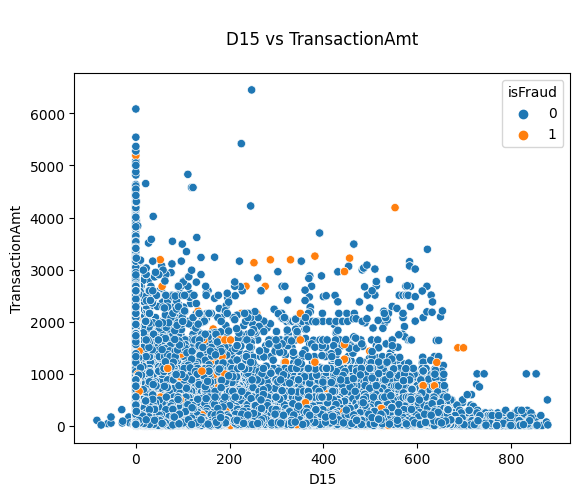

In [ ]:
sns.scatterplot(x='D15', y='TransactionAmt', hue='isFraud', data = train_data)
plt.title("\nD15 vs TransactionAmt\n")
plt.show()

In [ ]:
def label_encode(X_train, X_test, catf):

  '''
    Utility Function to Encode Categorical Features.
  '''

  for f in catf:

    X_train[f] = X_train[f].astype(str)
    X_test[f] = X_test[f].astype(str)

    le = LabelEncoder()
    le.fit(X_train[f])
    mapping = dict(zip(le.classes_, le.transform(le.classes_)))
    X_train[f] = le.transform(X_train[f])

    # Manually Encoding the CV and Test Dataset so as to avoid error for any category which is not present in train set

    # All the categories which are not present in train datset are encoded as -1

    X_test[f] = [-1 if mapping.get(v, -1)==-1 else mapping[v] for v in X_test[f].values ]

  return (X_train, X_test)

In [ ]:
def normalize(X_train, X_test):
    '''
        Utility Function to scale the values of the Train, CV and Test Datasets between 0 and 1.
    '''

    for f in X_train.columns:

        min_val = X_train[f].min()
        max_val = X_train[f].max()

        X_train[f] = (X_train[f]-min_val)/(max_val-min_val)
        X_test[f] = (X_test[f]-min_val)/(max_val-min_val)

    return (X_train, X_test)

In [ ]:
def predict_and_save(prediction, name):

    '''
        Utility Function to save the test data predictions locally.
    '''

    df = pd.DataFrame({'TransactionID':test_ids.reshape(-1), 'isFraud':prediction.reshape(-1)})
    df = df.sort_values('TransactionID')
    df.to_csv(name, index=False)

In [ ]:
X_train = train_data.drop(['isFraud', 'TransactionID'], axis=1)
y_train = train_data['isFraud']

X_test = test_data.drop(['TransactionID'], axis=1)
test_ids = test_data['TransactionID'].values

del train_data, test_data

In [ ]:
print("*"*45)
print("\n Train Data Shape : {} \n".format(X_train.shape))
print("\n Test Data Shape : {} \n".format(X_test.shape))
print("*"*45)

In [ ]:
# Storing Categorical and Numerical Feature Names

catf, numf = cat_num_features(X_train)
categorical_feature_indices = [X_train.columns.get_loc(f) for f in catf]

In [ ]:
# Imputing the missing values of Categorical Columns with "missing"

X_train[catf] = X_train[catf].fillna('missing')
X_test[catf] = X_test[catf].fillna('missing')


# Label Encoding Categorical Features

X_train, X_test = label_encode(X_train, X_test, catf)

In [ ]:
# Set1 (Imputed and Normalized)

X_train1 = X_train.fillna(-999)
X_test1 = X_test.fillna(-999)
X_train1, X_test1 = normalize(X_train1, X_test1)



# Set2 (Imputed)

X_train2 = X_train.fillna(-999)
X_test2 = X_test.fillna(-999)



# Set3 (Raw)

X_train3 = X_train
X_test3 = X_test

del X_train, X_test

In [ ]:
train1 = X_train1
train1['isFraud'] = y_train

test1 = X_test1

del X_train1, X_test1



train2 = X_train2
train2['isFraud'] = y_train

test2 = X_test2

del X_train2, X_test2



train3 = X_train3
train3['isFraud'] = y_train

test3 = X_test3

del X_train3, y_train, X_test3

In [ ]:
y_train = train1.pop('isFraud')
_ = train2.pop('isFraud')
_ = train3.pop('isFraud')


X_train1 = train1
X_test1 = test1

X_train2 = train2
X_test2 = test2

X_train3 = train3
X_test3 = test3

del train1, train2, train3

In [ ]:
print("*"*60)
print("\n Train Dataset Set1 Shape : {} \n".format(X_train1.shape))
print("\n Test Dataset Set1 Shape : {} \n".format(X_test1.shape))
print("*"*60)
print("\n Train Dataset Set1 Shape : {} \n".format(X_train1.shape))
print("\n Test Dataset Set2 Shape : {} \n".format(X_test2.shape))
print("*"*60)
print("\n Train Dataset Set1 Shape : {} \n".format(X_train1.shape))
print("\n Test Dataset Set3 Shape : {} \n".format(X_test3.shape))
print("*"*60)

In [ ]:
weight = y_train.value_counts()[0]/y_train.value_counts()[1]

In [ ]:
xgboost =  XGBClassifier(scale_pos_weight = weight, objective='binary:logistic', eval_metric = 'auc', random_state = 3, tree_method = 'gpu_hist')
xgboost.fit(X_train3, y_train)

In [ ]:
xgboost_test_proba = xgboost.predict_proba(X_test3)[:,1]

In [ ]:
predict_and_save(xgboost_test_proba, 'xgboost_pred_bl.csv')

## Parameter Tuning

In [ ]:
def hyperparam_vs_auc(train_roc_auc, cv_roc_auc):

    '''
        Utility Function to plot the Training and Cross Validation ROC-AUC Values
        for different Hyperparameter.
    '''

    plt.plot(range(len(train_roc_auc)), train_roc_auc, label='Train AUC')
    plt.plot(range(len(cv_roc_auc)), cv_roc_auc, label='CV AUC')

    plt.scatter(range(len(train_roc_auc)), train_roc_auc, label='Train AUC points')
    plt.scatter(range(len(cv_roc_auc)), cv_roc_auc, label='CV AUC points')

    plt.xticks(range(len(train_roc_auc)))
    plt.legend()
    plt.xlabel("Hyperparameter Index")
    plt.ylabel("AUC")
    plt.title("\n Hyperparameter vs ROC-AUC \n")
    plt.grid()
    plt.show()

In [ ]:
# Hyperparameters

learning_rate = [2e-2, 3e-1, 1e-1]
max_depth = [8, 12, 16]
subsample = [0.6,0.8,1]
colsample_bytree = [0.6,0.8,1]

In [ ]:
results = {}

dtrain = xgb.DMatrix(X_train, label=y_train)

for rate in learning_rate:
  for depth in max_depth:
    for sample in subsample:
      for colsample in colsample_bytree:

        params = {
          'objective' : 'binary:logistic',
          'eval_metric' : 'auc',
          'learning_rate' : rate,
          'max_depth' : depth,
          'subsample' : sample,
          'colsample_bytree' : colsample,
          'tree_method' : 'gpu_hist',
          'random_state' : 3,
        }

        history = xgb.cv(
            params,
            dtrain,
            num_boost_round = 3000,
            nfold = 3,
            metrics ='auc',
            early_stopping_rounds = 100,
            verbose_eval=100,
            seed=3,
            shuffle = False
        )

        name = "learning_rate : "+str(rate)+" max_depth : "+str(depth)+" subsample : "+str(sample)+" colsample_bytree : "+str(colsample)
        results[name] = (history.iloc[-1]['train-auc-mean'],history.iloc[-1]['test-auc-mean'])

In [ ]:
train_roc_auc = [auc[0] for auc in results.values()]
cv_roc_auc = [auc[1] for auc in results.values()]

In [ ]:
best_params = list(results.keys())[12]

In [ ]:
print("The Best Paramaters are {} ".format(best_params))